In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [2]:
class Generator(nn.Module):
    def __init__(self, z_dim, class_dim):
        super(Generator, self).__init__()
        self.embedding = nn.Embedding(class_dim, class_dim)
        self.net = nn.Sequential(
            nn.Linear(z_dim + class_dim, 384 * 4 * 4),
            nn.ReLU(True),

            nn.Unflatten(-1, (384, 4, 4)),
            nn.ConvTranspose2d(384, 192, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(192),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(192, 96, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(96),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(96, 3, 5, stride=2, padding=2, output_padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, x, noise):
        x = torch.cat((self.embedding(x), noise), -1)
        return self.net(x)

In [3]:
class Discriminator(nn.Module):
    def __init__(self, class_dim):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(16, 32, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(32, 64, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(64, 128, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(128, 256, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),
            
            nn.Conv2d(256, 512, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5),

            nn.Flatten(),
            nn.Linear(4*4*512, class_dim + 1)
        )

    def forward(self, x):
        x = self.net(x)
        sigmoid_x = torch.sigmoid(x[:, -1].view(-1, 1))
        return x[:, :-1], sigmoid_x

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)
    elif classname.find("Linear") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0)

In [5]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),  # Random Horizontal Flip Image
    transforms.RandomRotation(10),      # Randomly rotate the image ±10 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Adjust brightness, contrast, saturation and hue randomly
    transforms.RandomResizedCrop(32, scale=(0.8, 1.0)), # Random image cropping
    transforms.ToTensor(), # [0, 255] -> [0, 1]
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # [0, 1] -> [-1, 1]
])
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=100, shuffle=True, pin_memory=True, persistent_workers=True, prefetch_factor=4, num_workers=8)

Using downloaded and verified file: ./data/cifar-10-python.tar.gz
Extracting ./data/cifar-10-python.tar.gz to ./data


In [6]:
z_dim = 100
class_dim = 10
epochs = 1001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
labels_txt = ['Airplane','Automobile','Bird','Cat','Deer','Dog','Frog','Horse','Ship','Truck']

generator = Generator(z_dim, class_dim).to(device)
discriminator = Discriminator(class_dim).to(device)

generator.apply(weights_init)
discriminator.apply(weights_init)

opt_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
opt_disc = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

adversarial_loss = nn.BCELoss()
auxiliary_loss = nn.CrossEntropyLoss()

In [7]:
def plot_losses(loss_disc_arr, loss_gen_arr, eps):
    plt.figure(figsize=(12,4))
    plt.plot(np.arange(0, eps+1), loss_disc_arr, label="disc")
    plt.plot(np.arange(0, eps+1), loss_gen_arr, label="gen")
    plt.xlabel("eps")
    plt.ylabel("loss")
    plt.title("Loss vs Epsilon (eps="+str(eps)+")")
    plt.legend()
    plt.show()

def plot_grads(grad_disc_arr, grad_gen_arr, eps):
    plt.figure(figsize=(12,4))
    plt.plot(np.arange(0, eps+1), grad_disc_arr, label="disc")
    plt.plot(np.arange(0, eps+1), grad_gen_arr, label="gen")
    plt.xlabel("eps")
    plt.ylabel("grad")
    plt.title("Grad vs Epsilon (eps="+str(eps)+")")
    plt.legend()
    plt.show()

Epoch [1/1001] Loss D: 2.17191, Loss G: 1.15113
Epoch [2/1001] Loss D: 1.80254, Loss G: 1.31344
Epoch [3/1001] Loss D: 1.64546, Loss G: 1.09940
Epoch [4/1001] Loss D: 1.76043, Loss G: 1.17459
Epoch [5/1001] Loss D: 1.59375, Loss G: 0.96988
Epoch [6/1001] Loss D: 1.70359, Loss G: 1.25546
Epoch [7/1001] Loss D: 1.46821, Loss G: 1.35034
Epoch [8/1001] Loss D: 1.62285, Loss G: 1.12785
Epoch [9/1001] Loss D: 1.68875, Loss G: 1.10665
Epoch [10/1001] Loss D: 1.50764, Loss G: 1.19120
Epoch [11/1001] Loss D: 1.42709, Loss G: 1.28638
Epoch [12/1001] Loss D: 1.59422, Loss G: 1.21887
Epoch [13/1001] Loss D: 1.55211, Loss G: 0.94098
Epoch [14/1001] Loss D: 1.48764, Loss G: 1.07576
Epoch [15/1001] Loss D: 1.54914, Loss G: 1.20625
Epoch [16/1001] Loss D: 1.51898, Loss G: 1.02248
Epoch [17/1001] Loss D: 1.48875, Loss G: 1.15655
Epoch [18/1001] Loss D: 1.51886, Loss G: 1.18786
Epoch [19/1001] Loss D: 1.45435, Loss G: 1.06423
Epoch [20/1001] Loss D: 1.58435, Loss G: 1.02575
Epoch [21/1001] Loss D: 1.632

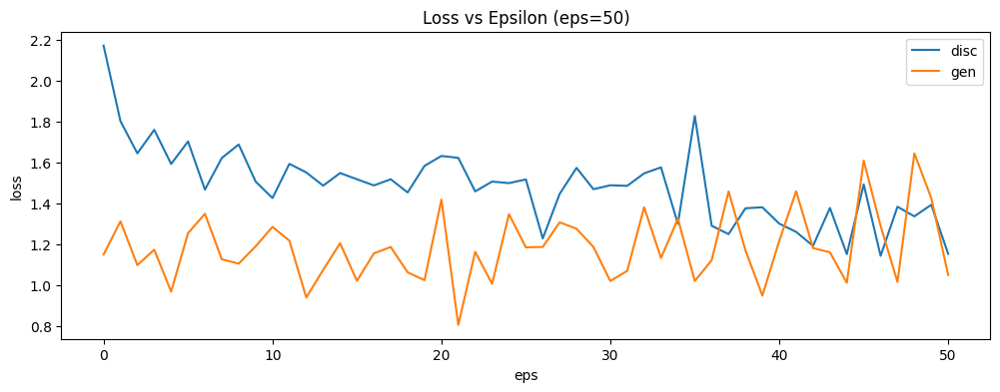

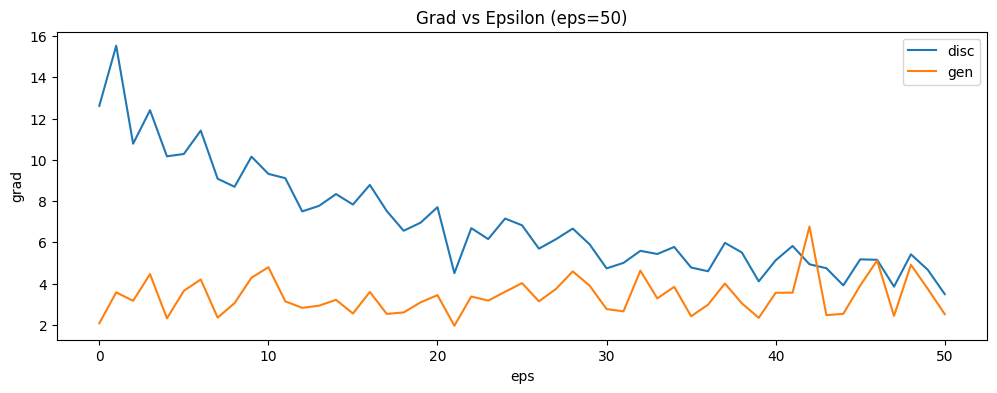

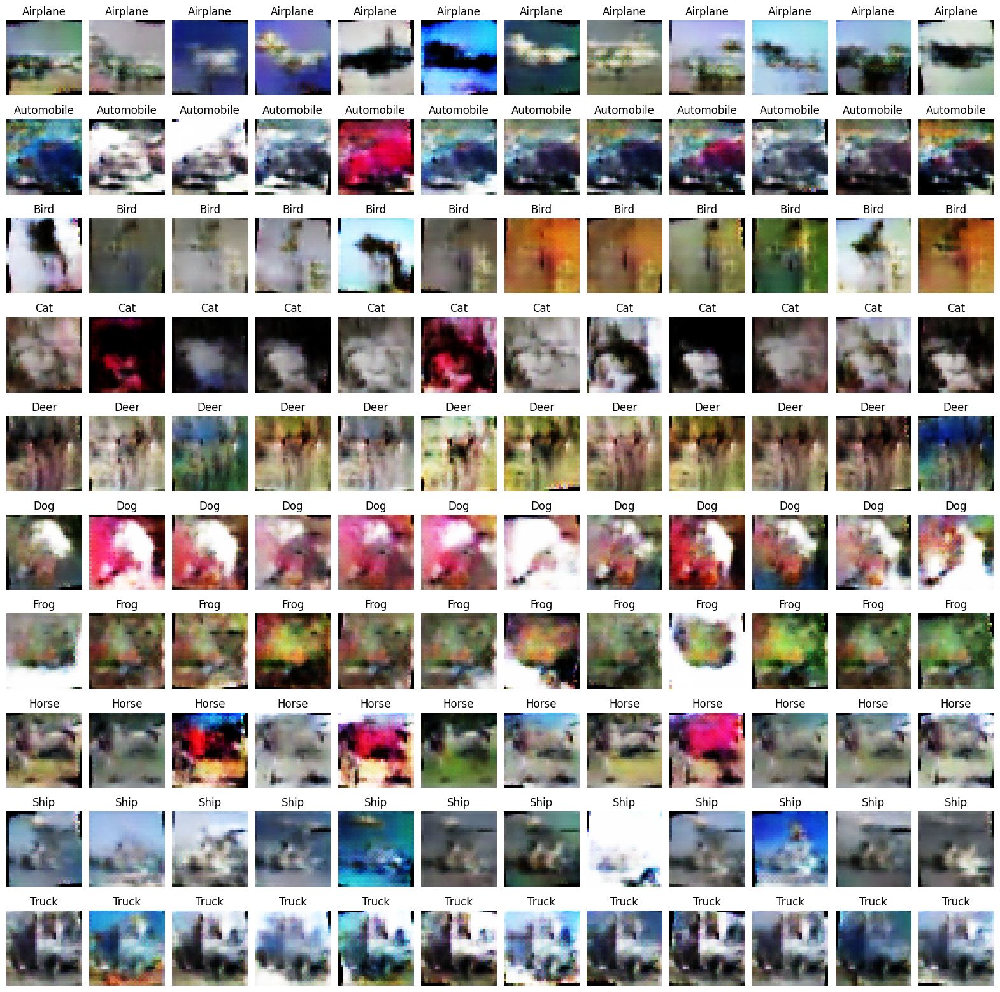

Epoch [52/1001] Loss D: 1.37757, Loss G: 1.19763
Epoch [53/1001] Loss D: 1.36995, Loss G: 1.50948
Epoch [54/1001] Loss D: 1.23735, Loss G: 1.19355
Epoch [55/1001] Loss D: 1.30702, Loss G: 0.93189
Epoch [56/1001] Loss D: 1.31489, Loss G: 1.38162
Epoch [57/1001] Loss D: 1.45019, Loss G: 1.36066
Epoch [58/1001] Loss D: 1.43238, Loss G: 1.51413
Epoch [59/1001] Loss D: 1.22090, Loss G: 1.43882
Epoch [60/1001] Loss D: 1.37761, Loss G: 1.21779
Epoch [61/1001] Loss D: 1.20311, Loss G: 1.56344
Epoch [62/1001] Loss D: 1.38776, Loss G: 1.07678
Epoch [63/1001] Loss D: 1.51616, Loss G: 1.24632
Epoch [64/1001] Loss D: 1.52890, Loss G: 1.12239
Epoch [65/1001] Loss D: 1.28449, Loss G: 1.38632
Epoch [66/1001] Loss D: 1.54563, Loss G: 1.51247
Epoch [67/1001] Loss D: 1.42858, Loss G: 1.21128
Epoch [68/1001] Loss D: 1.34156, Loss G: 1.00569
Epoch [69/1001] Loss D: 1.34667, Loss G: 1.07641
Epoch [70/1001] Loss D: 1.29598, Loss G: 1.25162
Epoch [71/1001] Loss D: 1.45300, Loss G: 1.24295
Epoch [72/1001] Loss

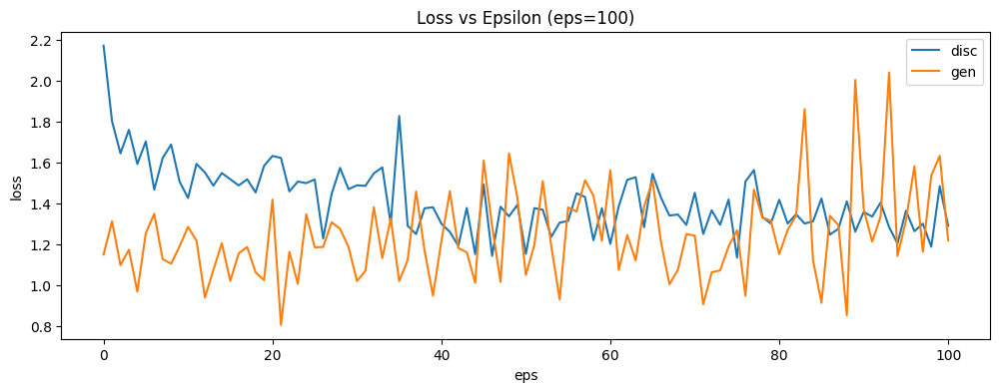

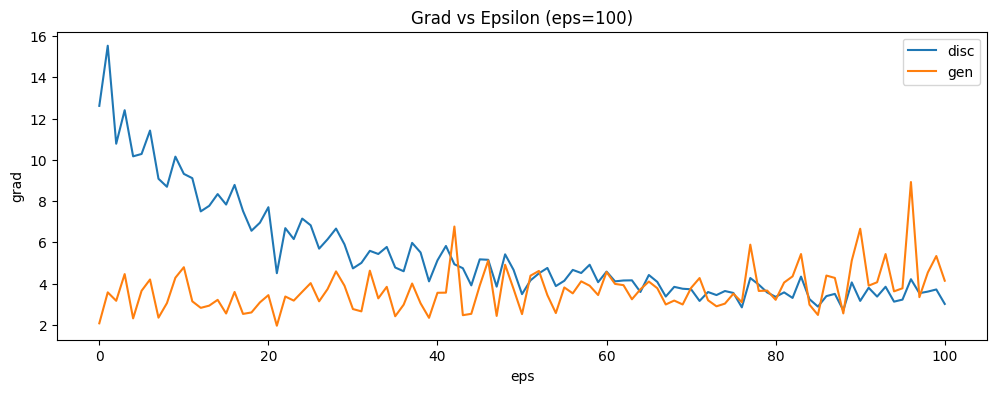

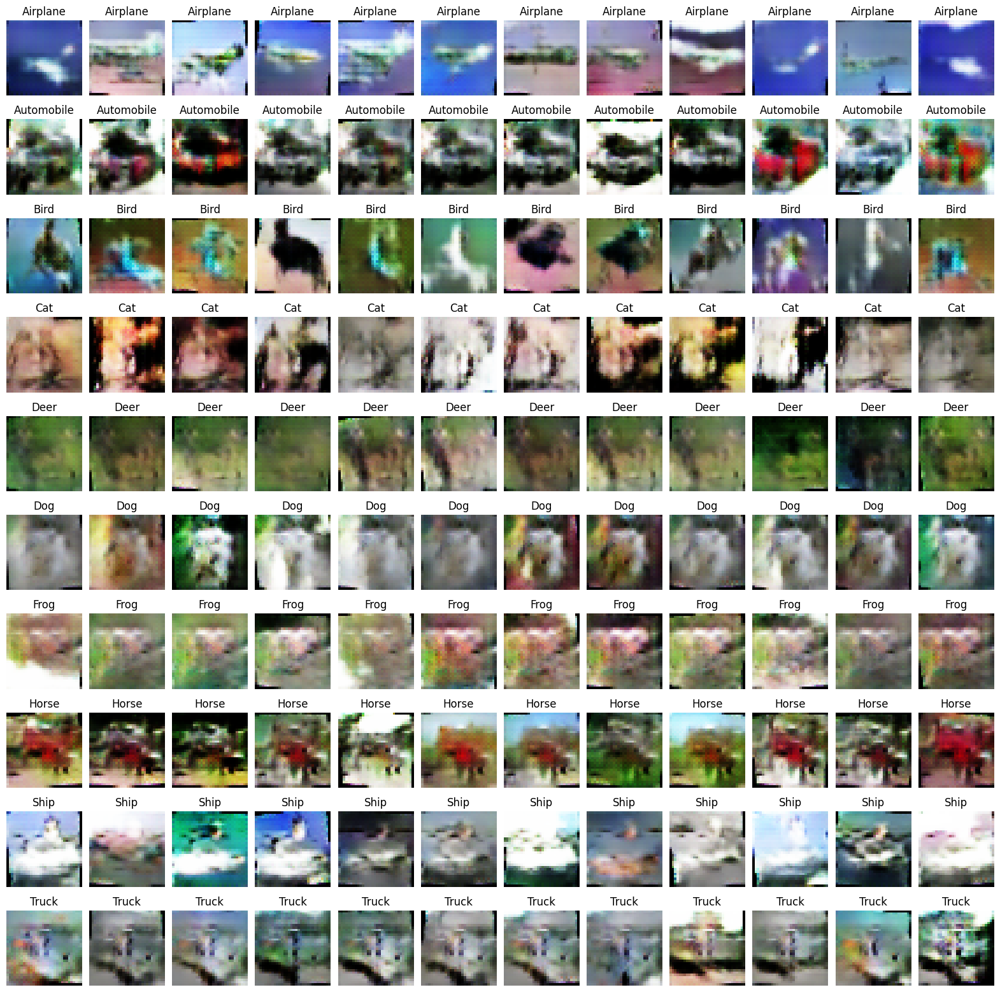

Epoch [102/1001] Loss D: 1.36606, Loss G: 0.84179
Epoch [103/1001] Loss D: 1.35432, Loss G: 1.89084
Epoch [104/1001] Loss D: 1.14931, Loss G: 1.52710
Epoch [105/1001] Loss D: 1.48737, Loss G: 1.32270
Epoch [106/1001] Loss D: 1.21804, Loss G: 1.63954
Epoch [107/1001] Loss D: 1.48564, Loss G: 1.12241
Epoch [108/1001] Loss D: 1.23664, Loss G: 1.36003
Epoch [109/1001] Loss D: 1.44112, Loss G: 1.22655
Epoch [110/1001] Loss D: 0.96221, Loss G: 1.74263
Epoch [111/1001] Loss D: 1.01606, Loss G: 1.50617
Epoch [112/1001] Loss D: 1.19199, Loss G: 1.27023
Epoch [113/1001] Loss D: 1.44939, Loss G: 1.41538
Epoch [114/1001] Loss D: 1.26537, Loss G: 1.61244
Epoch [115/1001] Loss D: 1.29840, Loss G: 1.67022
Epoch [116/1001] Loss D: 1.40839, Loss G: 1.37662
Epoch [117/1001] Loss D: 1.18620, Loss G: 1.11312
Epoch [118/1001] Loss D: 0.93128, Loss G: 1.33274
Epoch [119/1001] Loss D: 1.42575, Loss G: 1.32376
Epoch [120/1001] Loss D: 1.59128, Loss G: 0.72462
Epoch [121/1001] Loss D: 1.45616, Loss G: 1.70854


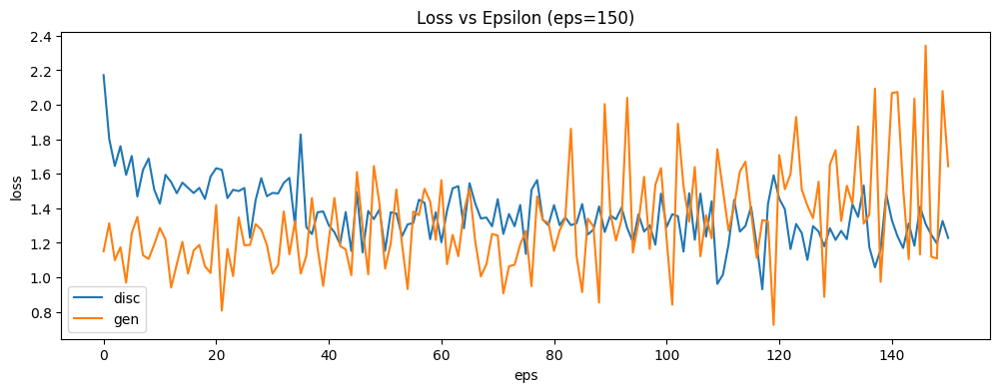

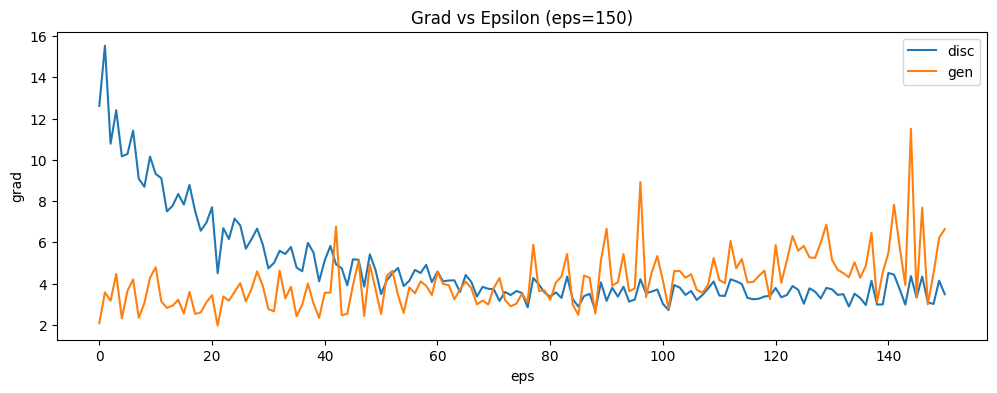

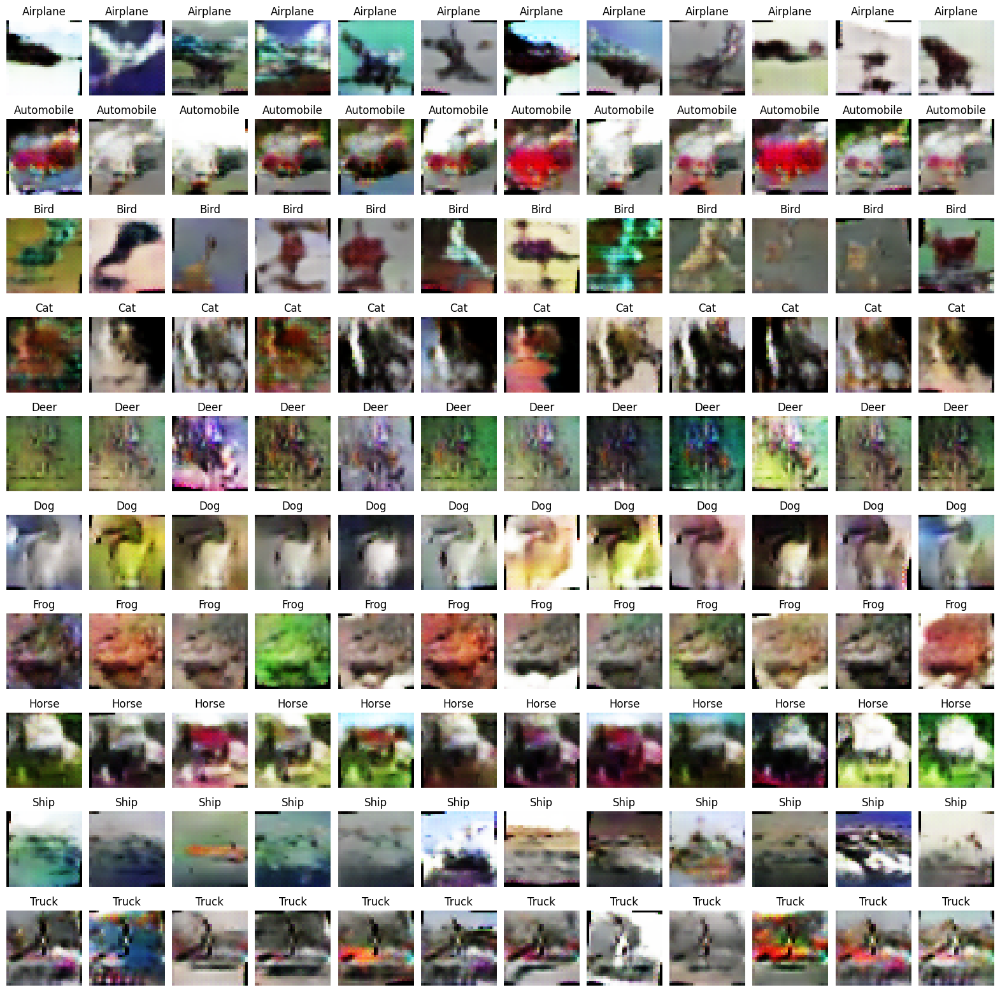

Epoch [152/1001] Loss D: 1.19554, Loss G: 1.27767
Epoch [153/1001] Loss D: 1.41914, Loss G: 1.76391
Epoch [154/1001] Loss D: 1.24212, Loss G: 1.24176
Epoch [155/1001] Loss D: 1.05352, Loss G: 1.00397
Epoch [156/1001] Loss D: 1.45805, Loss G: 2.13648
Epoch [157/1001] Loss D: 1.38468, Loss G: 1.39186
Epoch [158/1001] Loss D: 1.24440, Loss G: 1.54496
Epoch [159/1001] Loss D: 1.31999, Loss G: 1.22356
Epoch [160/1001] Loss D: 1.31773, Loss G: 1.78577
Epoch [161/1001] Loss D: 1.48630, Loss G: 1.52391
Epoch [162/1001] Loss D: 1.43693, Loss G: 1.69305
Epoch [163/1001] Loss D: 1.18651, Loss G: 2.49121
Epoch [164/1001] Loss D: 1.11795, Loss G: 2.28602
Epoch [165/1001] Loss D: 1.49341, Loss G: 1.73638
Epoch [166/1001] Loss D: 1.15531, Loss G: 0.81693
Epoch [167/1001] Loss D: 1.40800, Loss G: 1.79461
Epoch [168/1001] Loss D: 1.30591, Loss G: 1.42639
Epoch [169/1001] Loss D: 1.30496, Loss G: 1.35037
Epoch [170/1001] Loss D: 1.45478, Loss G: 1.34342
Epoch [171/1001] Loss D: 1.38730, Loss G: 2.61644


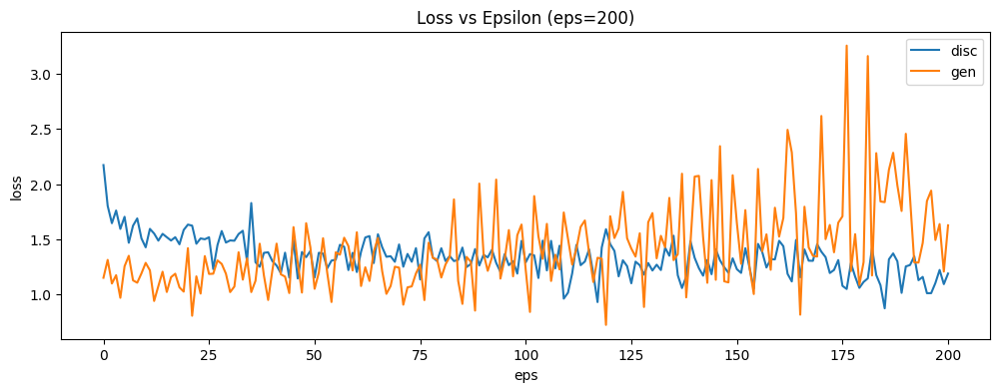

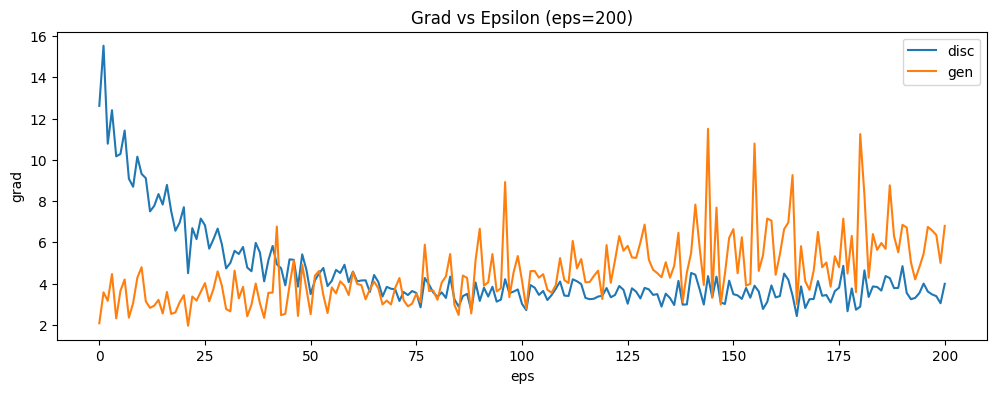

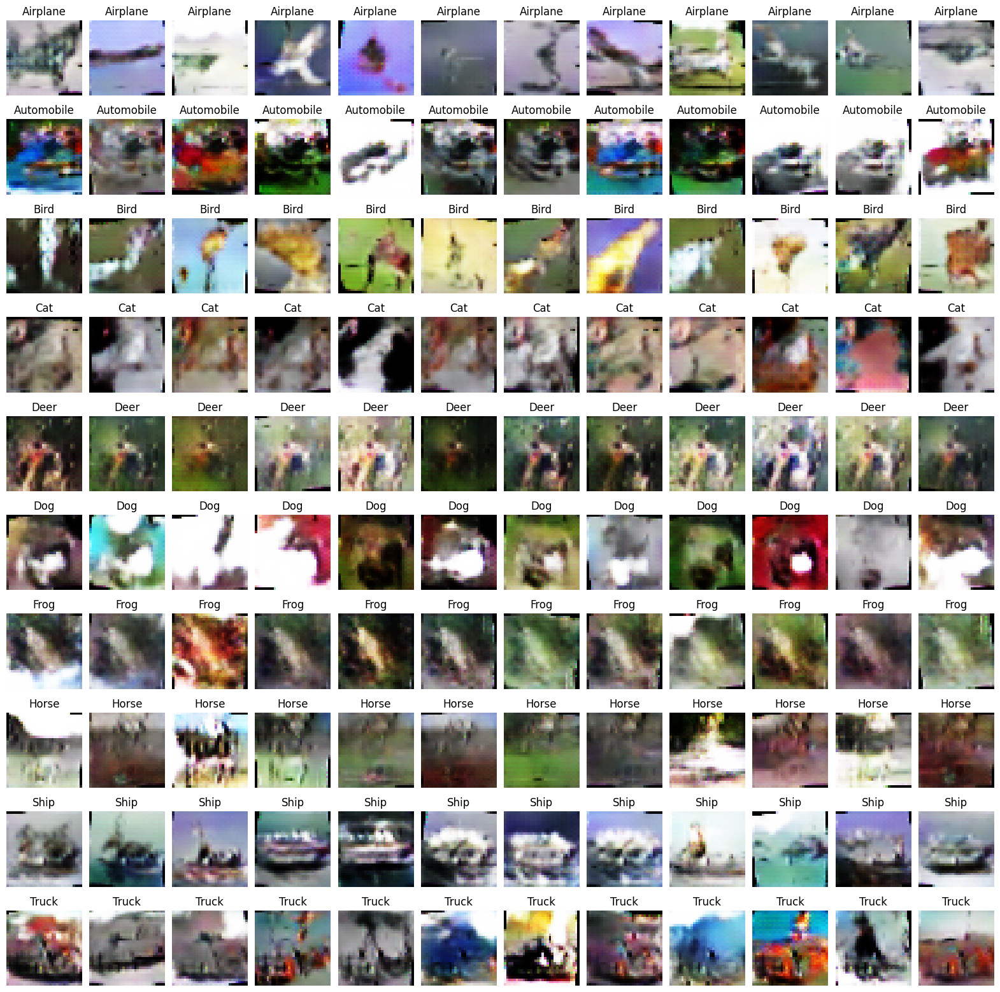

Epoch [202/1001] Loss D: 1.26794, Loss G: 0.87739
Epoch [203/1001] Loss D: 1.23214, Loss G: 2.03965
Epoch [204/1001] Loss D: 1.17030, Loss G: 1.84619
Epoch [205/1001] Loss D: 1.12659, Loss G: 2.38248
Epoch [206/1001] Loss D: 1.19715, Loss G: 1.26445
Epoch [207/1001] Loss D: 1.35593, Loss G: 1.23388
Epoch [208/1001] Loss D: 1.19070, Loss G: 1.78977
Epoch [209/1001] Loss D: 1.06009, Loss G: 2.79414
Epoch [210/1001] Loss D: 1.14996, Loss G: 1.53616
Epoch [211/1001] Loss D: 0.96327, Loss G: 2.07762
Epoch [212/1001] Loss D: 1.36608, Loss G: 1.55030
Epoch [213/1001] Loss D: 1.41659, Loss G: 1.40321
Epoch [214/1001] Loss D: 1.41834, Loss G: 1.07949
Epoch [215/1001] Loss D: 1.31759, Loss G: 1.70333
Epoch [216/1001] Loss D: 1.14990, Loss G: 1.37829
Epoch [217/1001] Loss D: 1.01899, Loss G: 1.51009
Epoch [218/1001] Loss D: 1.59533, Loss G: 1.13825
Epoch [219/1001] Loss D: 1.25153, Loss G: 1.42797
Epoch [220/1001] Loss D: 1.26556, Loss G: 1.66395
Epoch [221/1001] Loss D: 1.09629, Loss G: 2.22133


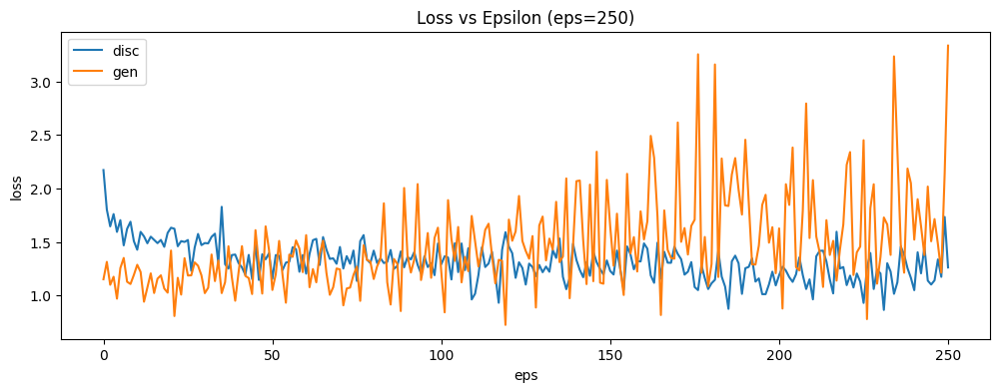

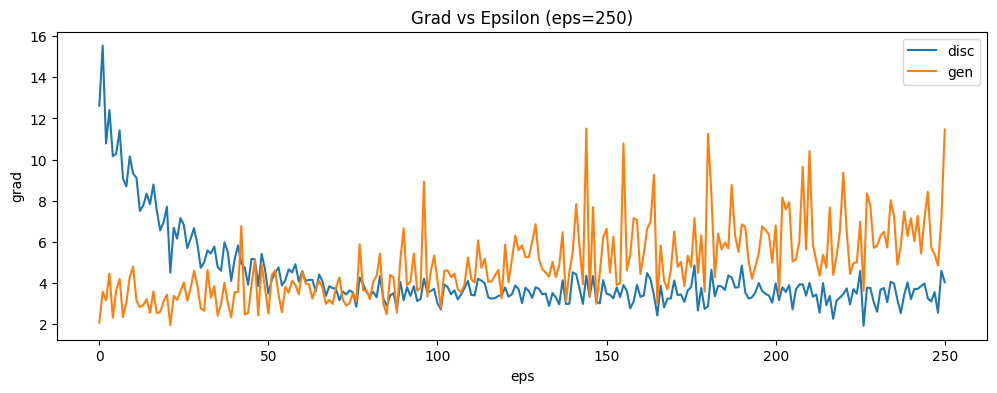

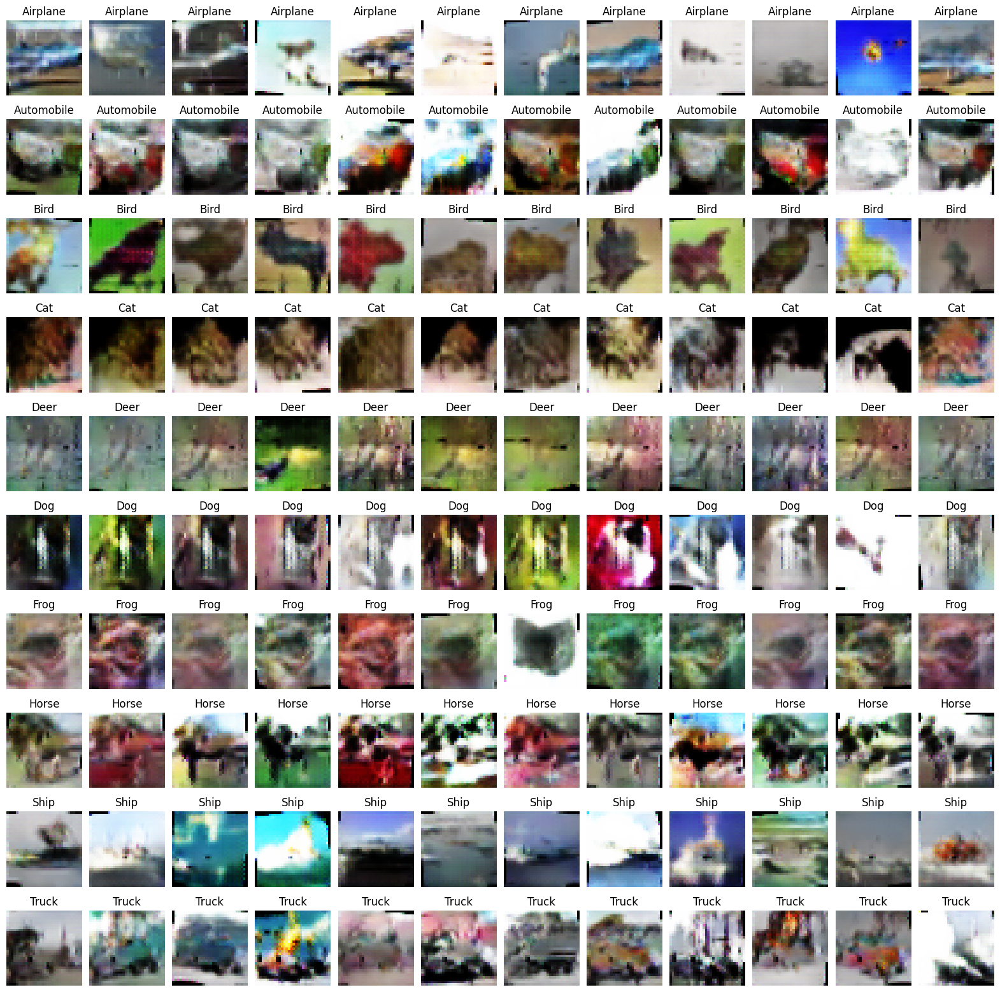

Epoch [252/1001] Loss D: 1.31489, Loss G: 1.48015
Epoch [253/1001] Loss D: 1.06457, Loss G: 2.00331
Epoch [254/1001] Loss D: 1.25353, Loss G: 1.25755
Epoch [255/1001] Loss D: 1.25026, Loss G: 2.35356
Epoch [256/1001] Loss D: 1.19433, Loss G: 1.38971
Epoch [257/1001] Loss D: 1.20016, Loss G: 1.33904
Epoch [258/1001] Loss D: 1.53787, Loss G: 1.40925
Epoch [259/1001] Loss D: 1.00342, Loss G: 1.07933
Epoch [260/1001] Loss D: 1.25685, Loss G: 1.75599
Epoch [261/1001] Loss D: 1.13810, Loss G: 1.23011
Epoch [262/1001] Loss D: 0.97299, Loss G: 2.58125
Epoch [263/1001] Loss D: 1.12790, Loss G: 0.89879
Epoch [264/1001] Loss D: 1.29787, Loss G: 1.56519
Epoch [265/1001] Loss D: 1.14356, Loss G: 1.59928
Epoch [266/1001] Loss D: 1.28307, Loss G: 1.27564
Epoch [267/1001] Loss D: 1.13406, Loss G: 1.89485
Epoch [268/1001] Loss D: 1.19458, Loss G: 1.84006
Epoch [269/1001] Loss D: 0.92393, Loss G: 1.86299
Epoch [270/1001] Loss D: 1.20893, Loss G: 1.34518
Epoch [271/1001] Loss D: 1.02760, Loss G: 1.85421


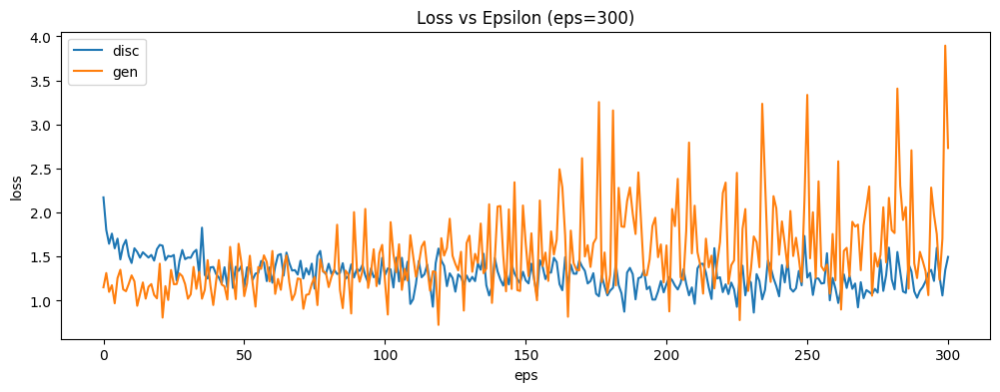

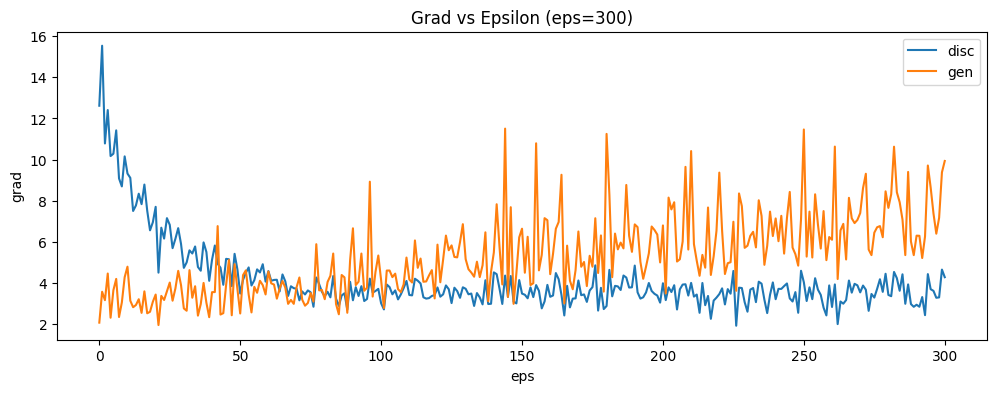

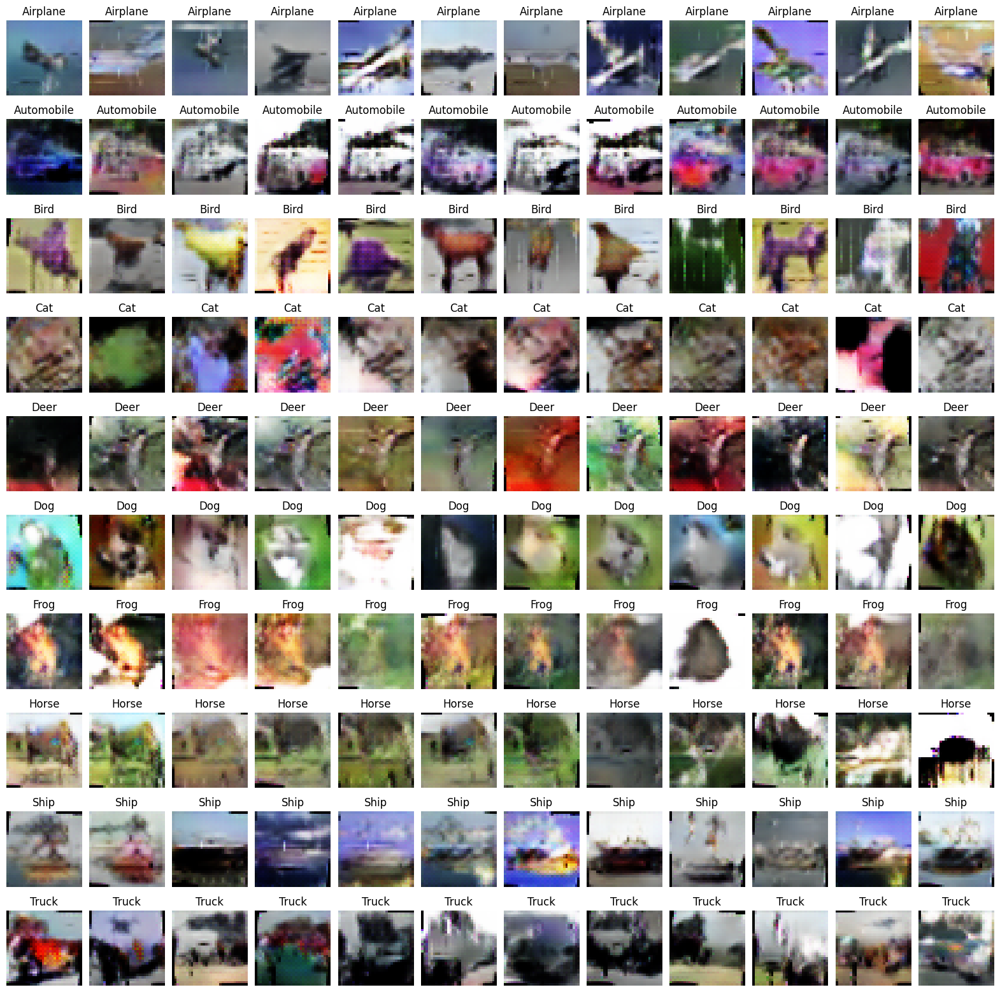

Epoch [302/1001] Loss D: 1.28089, Loss G: 1.52480
Epoch [303/1001] Loss D: 1.28748, Loss G: 2.22329
Epoch [304/1001] Loss D: 1.12138, Loss G: 2.31390
Epoch [305/1001] Loss D: 1.12169, Loss G: 1.99431
Epoch [306/1001] Loss D: 1.20100, Loss G: 1.97035
Epoch [307/1001] Loss D: 1.74367, Loss G: 1.47877
Epoch [308/1001] Loss D: 1.23067, Loss G: 2.03199
Epoch [309/1001] Loss D: 1.42033, Loss G: 1.49174
Epoch [310/1001] Loss D: 0.86330, Loss G: 1.35248
Epoch [311/1001] Loss D: 1.21817, Loss G: 2.68666
Epoch [312/1001] Loss D: 0.91532, Loss G: 1.76497
Epoch [313/1001] Loss D: 1.68709, Loss G: 2.77647
Epoch [314/1001] Loss D: 0.97729, Loss G: 2.13423
Epoch [315/1001] Loss D: 1.34370, Loss G: 0.97990
Epoch [316/1001] Loss D: 1.29612, Loss G: 1.58910
Epoch [317/1001] Loss D: 1.16803, Loss G: 2.03363
Epoch [318/1001] Loss D: 1.25873, Loss G: 1.31609
Epoch [319/1001] Loss D: 1.22568, Loss G: 2.97115
Epoch [320/1001] Loss D: 1.47733, Loss G: 2.76652
Epoch [321/1001] Loss D: 1.38222, Loss G: 1.12247


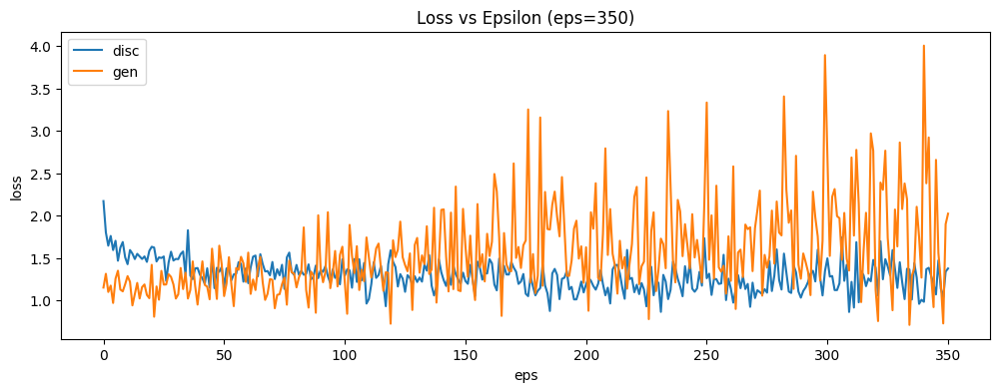

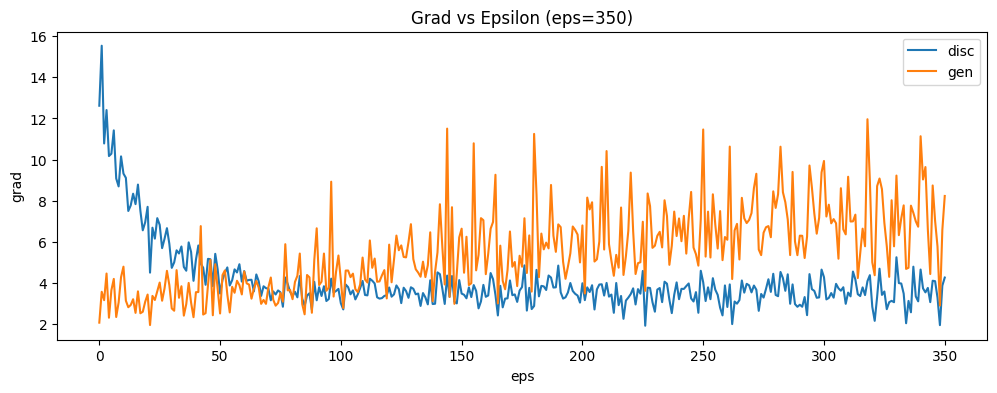

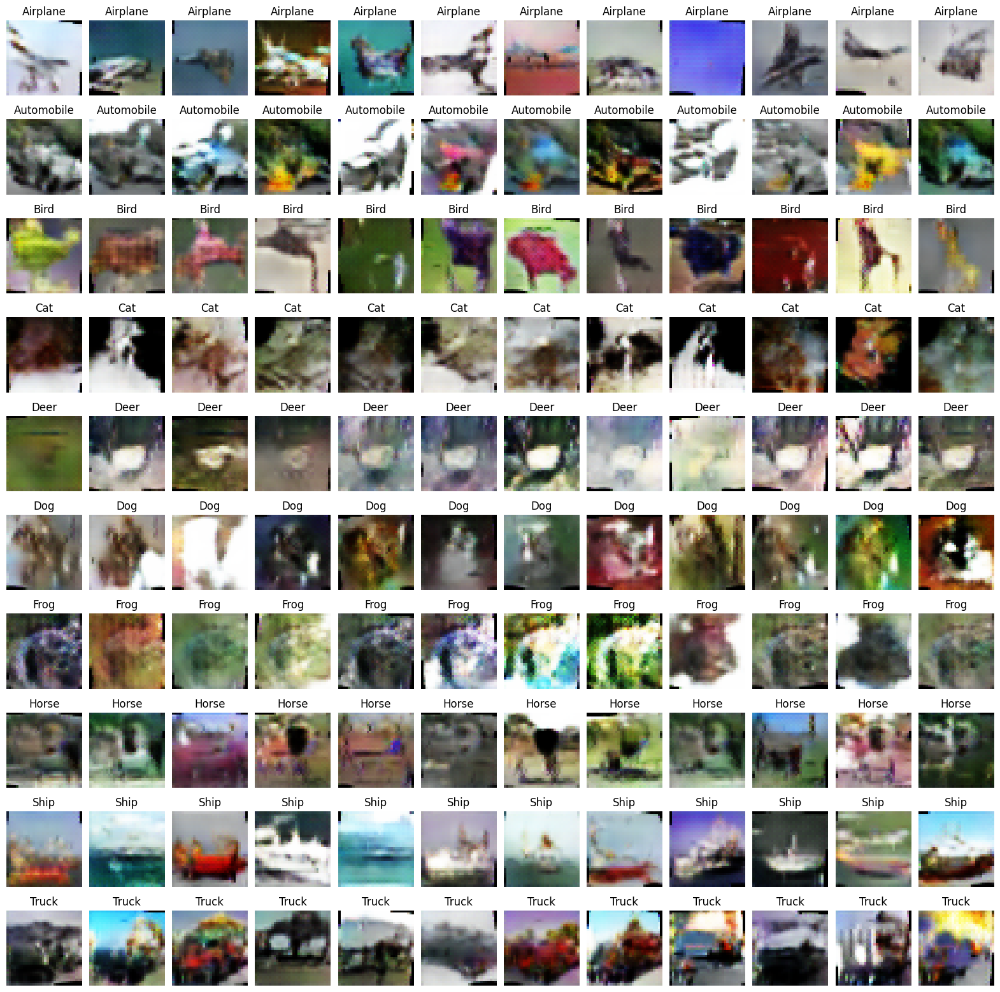

Epoch [352/1001] Loss D: 1.69831, Loss G: 1.27807
Epoch [353/1001] Loss D: 1.36587, Loss G: 2.53912
Epoch [354/1001] Loss D: 1.07543, Loss G: 1.81184
Epoch [355/1001] Loss D: 1.62837, Loss G: 1.37345
Epoch [356/1001] Loss D: 0.90889, Loss G: 1.50443
Epoch [357/1001] Loss D: 1.17351, Loss G: 2.03236
Epoch [358/1001] Loss D: 1.66360, Loss G: 1.70690
Epoch [359/1001] Loss D: 1.03684, Loss G: 1.74705
Epoch [360/1001] Loss D: 0.92588, Loss G: 0.78068
Epoch [361/1001] Loss D: 0.95716, Loss G: 1.40492
Epoch [362/1001] Loss D: 0.91579, Loss G: 1.70993
Epoch [363/1001] Loss D: 1.00753, Loss G: 2.61679
Epoch [364/1001] Loss D: 1.14975, Loss G: 1.64282
Epoch [365/1001] Loss D: 1.42150, Loss G: 2.87414
Epoch [366/1001] Loss D: 1.01383, Loss G: 1.24579
Epoch [367/1001] Loss D: 1.07770, Loss G: 1.70294
Epoch [368/1001] Loss D: 1.13906, Loss G: 2.23116
Epoch [369/1001] Loss D: 1.83494, Loss G: 1.92824
Epoch [370/1001] Loss D: 1.11489, Loss G: 2.82666
Epoch [371/1001] Loss D: 1.29625, Loss G: 2.06407


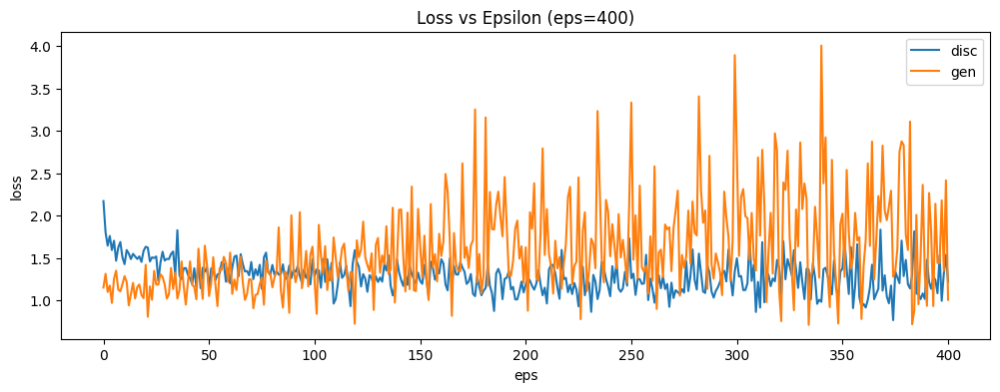

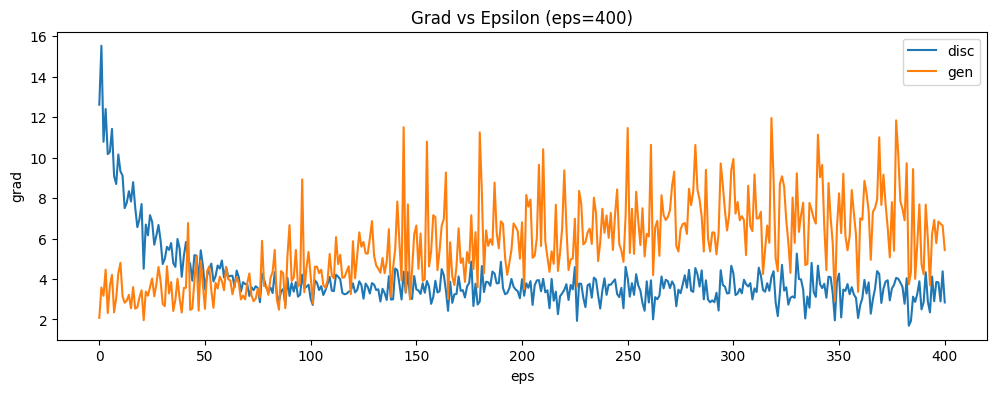

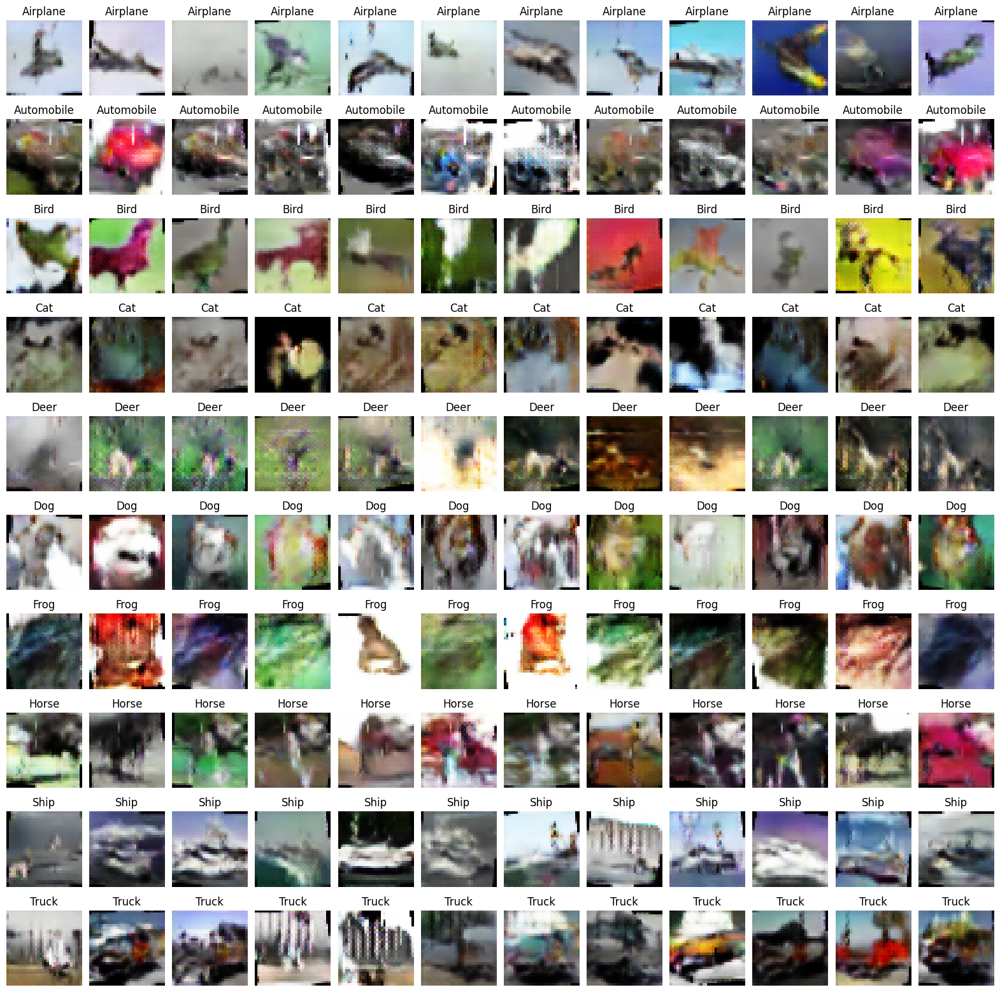

Epoch [402/1001] Loss D: 0.90450, Loss G: 1.82517
Epoch [403/1001] Loss D: 1.20794, Loss G: 1.87258
Epoch [404/1001] Loss D: 1.13955, Loss G: 2.85688
Epoch [405/1001] Loss D: 1.13835, Loss G: 2.64778
Epoch [406/1001] Loss D: 1.45845, Loss G: 1.72506
Epoch [407/1001] Loss D: 1.26646, Loss G: 1.62776
Epoch [408/1001] Loss D: 1.22254, Loss G: 3.21451
Epoch [409/1001] Loss D: 1.14129, Loss G: 2.91469
Epoch [410/1001] Loss D: 1.22544, Loss G: 1.70818
Epoch [411/1001] Loss D: 1.02901, Loss G: 0.95741
Epoch [412/1001] Loss D: 1.41436, Loss G: 1.18996
Epoch [413/1001] Loss D: 1.24621, Loss G: 1.89448
Epoch [414/1001] Loss D: 1.04992, Loss G: 1.72348
Epoch [415/1001] Loss D: 1.20249, Loss G: 1.82275
Epoch [416/1001] Loss D: 1.04589, Loss G: 1.21898
Epoch [417/1001] Loss D: 1.43308, Loss G: 1.16353
Epoch [418/1001] Loss D: 1.16687, Loss G: 1.00479
Epoch [419/1001] Loss D: 1.17406, Loss G: 2.95627
Epoch [420/1001] Loss D: 1.22013, Loss G: 1.90728
Epoch [421/1001] Loss D: 1.54142, Loss G: 2.06996


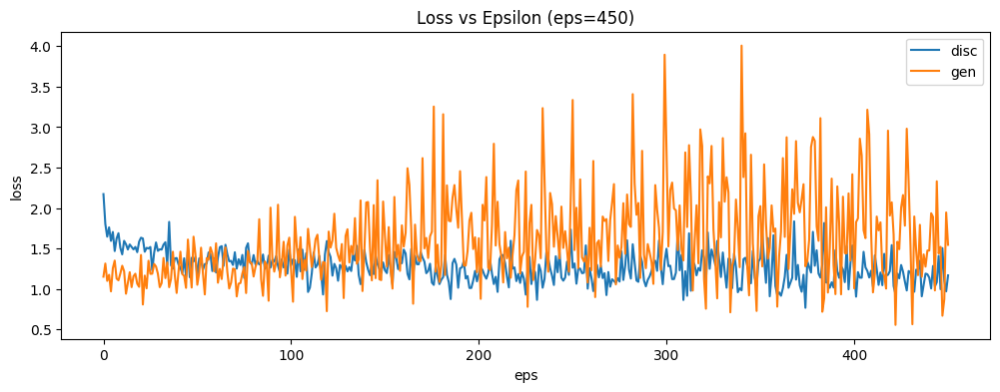

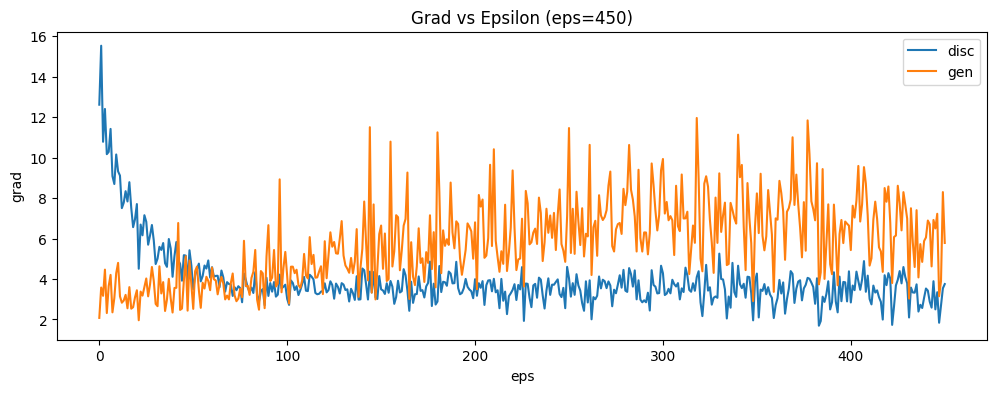

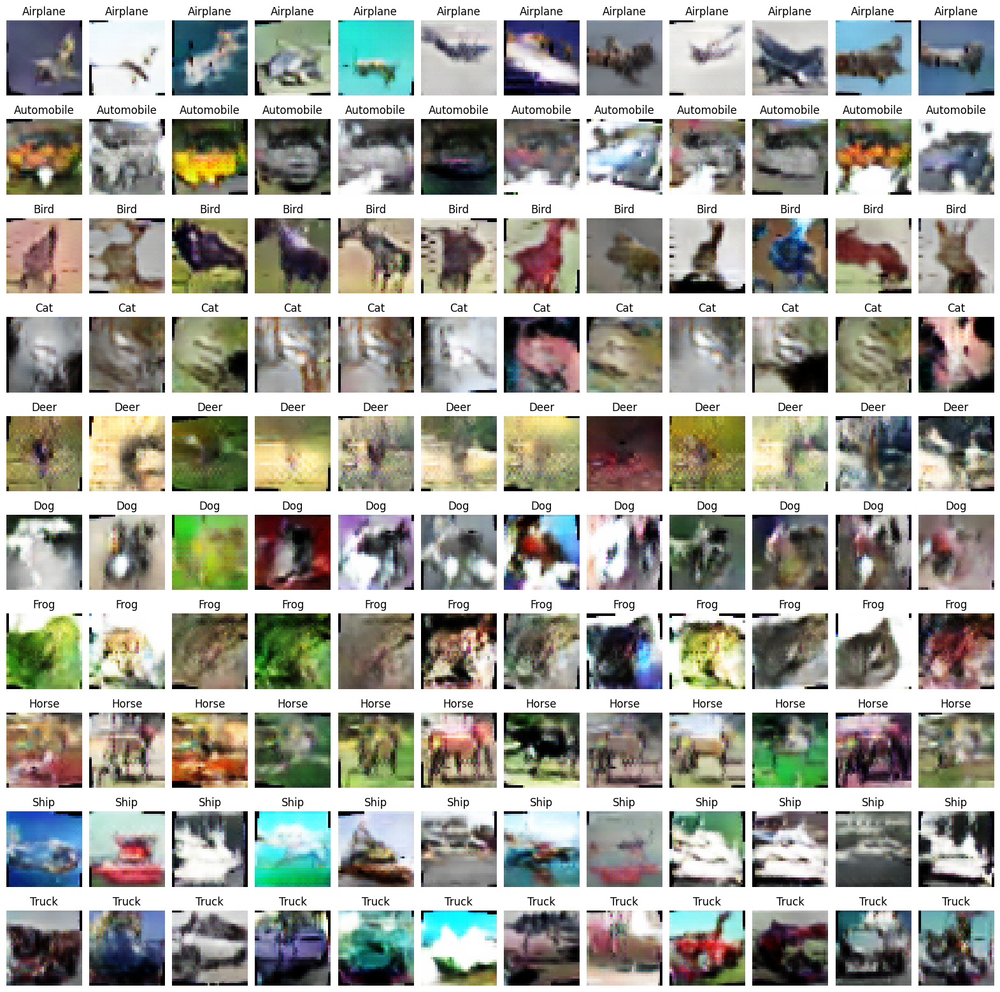

Epoch [452/1001] Loss D: 1.17153, Loss G: 1.72252
Epoch [453/1001] Loss D: 1.21759, Loss G: 2.23155
Epoch [454/1001] Loss D: 1.06089, Loss G: 2.55141
Epoch [455/1001] Loss D: 1.00341, Loss G: 1.13657
Epoch [456/1001] Loss D: 1.15502, Loss G: 2.29857
Epoch [457/1001] Loss D: 1.30998, Loss G: 0.92495
Epoch [458/1001] Loss D: 1.00671, Loss G: 1.42812
Epoch [459/1001] Loss D: 1.05790, Loss G: 2.35141
Epoch [460/1001] Loss D: 0.91636, Loss G: 1.83930
Epoch [461/1001] Loss D: 1.57239, Loss G: 2.58662
Epoch [462/1001] Loss D: 1.31706, Loss G: 2.11615
Epoch [463/1001] Loss D: 1.27817, Loss G: 1.03728
Epoch [464/1001] Loss D: 1.06364, Loss G: 2.39192
Epoch [465/1001] Loss D: 1.25881, Loss G: 2.10390
Epoch [466/1001] Loss D: 1.20117, Loss G: 2.40208
Epoch [467/1001] Loss D: 0.91411, Loss G: 1.38638
Epoch [468/1001] Loss D: 1.33919, Loss G: 2.08651
Epoch [469/1001] Loss D: 1.21723, Loss G: 1.61438
Epoch [470/1001] Loss D: 1.36700, Loss G: 2.92423
Epoch [471/1001] Loss D: 1.19956, Loss G: 2.04009


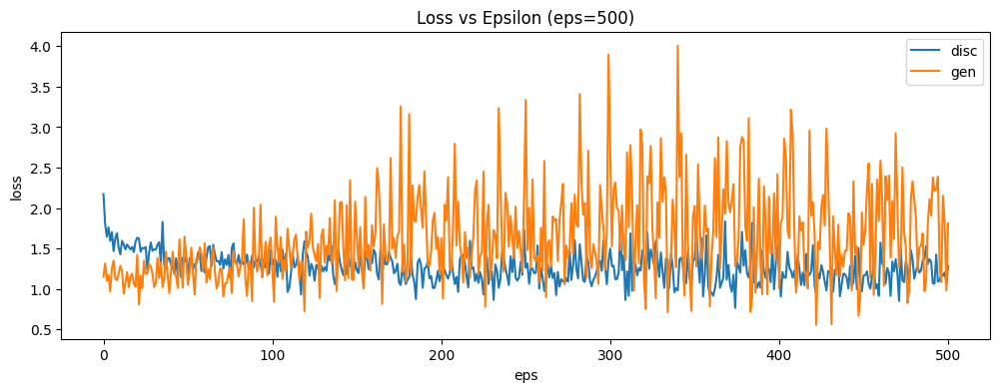

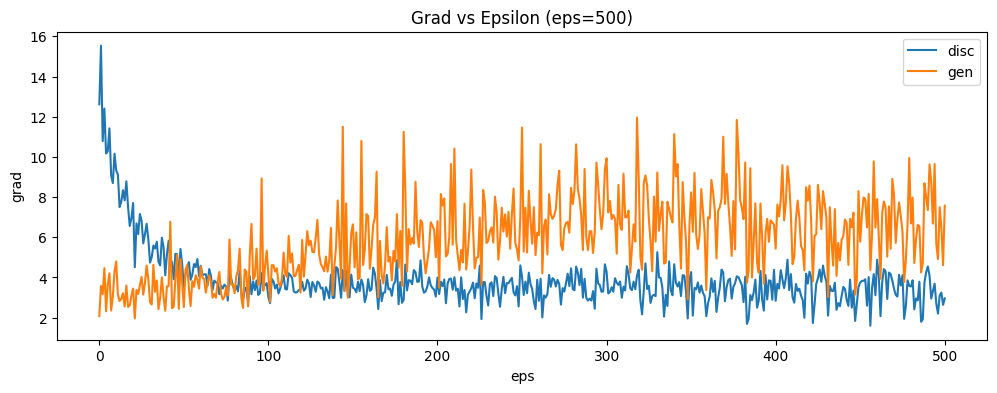

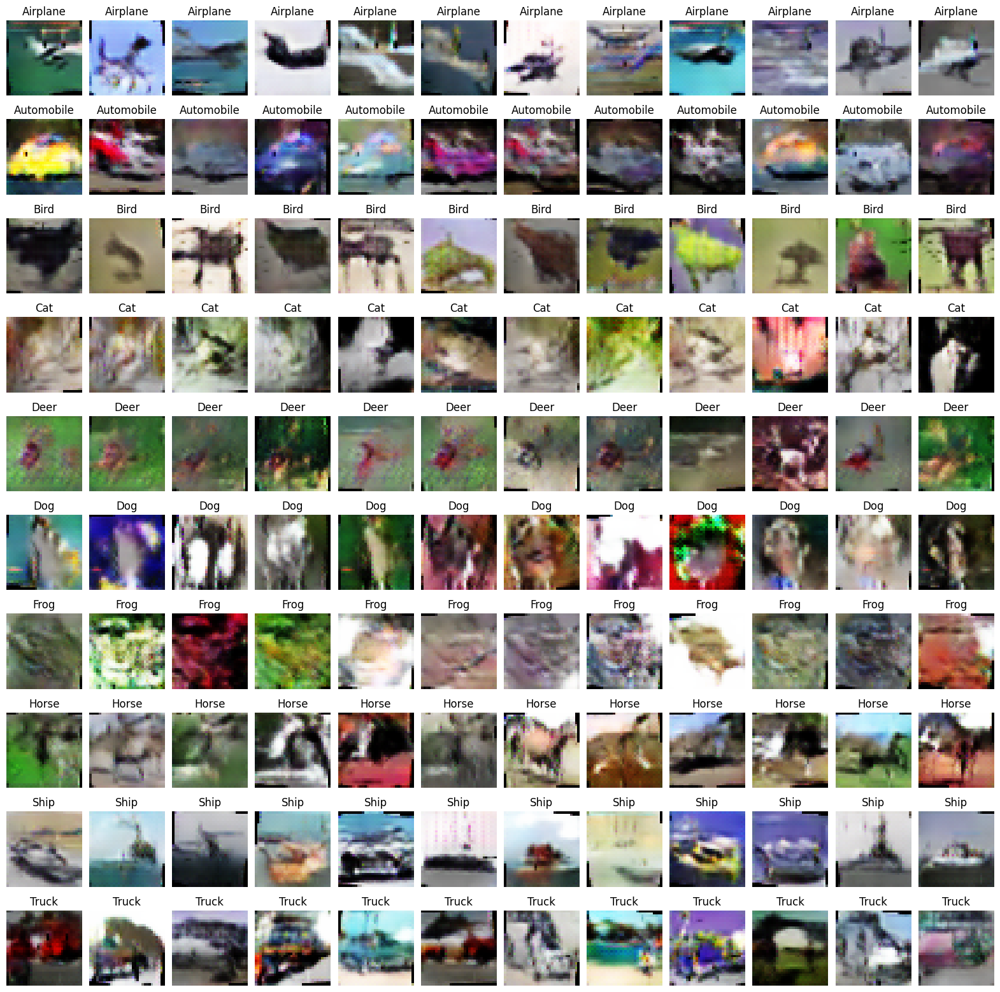

Epoch [502/1001] Loss D: 1.36105, Loss G: 2.87906
Epoch [503/1001] Loss D: 1.01727, Loss G: 1.46625
Epoch [504/1001] Loss D: 1.32824, Loss G: 2.96295
Epoch [505/1001] Loss D: 1.13761, Loss G: 0.78439
Epoch [506/1001] Loss D: 1.31570, Loss G: 1.44676
Epoch [507/1001] Loss D: 1.34598, Loss G: 0.88135
Epoch [508/1001] Loss D: 1.39086, Loss G: 0.42546
Epoch [509/1001] Loss D: 0.96813, Loss G: 2.20027
Epoch [510/1001] Loss D: 1.38637, Loss G: 3.82616
Epoch [511/1001] Loss D: 1.53751, Loss G: 1.46086
Epoch [512/1001] Loss D: 1.24663, Loss G: 1.87150
Epoch [513/1001] Loss D: 1.04924, Loss G: 1.64796
Epoch [514/1001] Loss D: 0.97423, Loss G: 2.13762
Epoch [515/1001] Loss D: 1.06114, Loss G: 1.29864
Epoch [516/1001] Loss D: 0.97784, Loss G: 2.40711
Epoch [517/1001] Loss D: 1.28459, Loss G: 1.58420
Epoch [518/1001] Loss D: 0.84125, Loss G: 1.21229
Epoch [519/1001] Loss D: 1.16431, Loss G: 2.37923
Epoch [520/1001] Loss D: 0.95305, Loss G: 1.88003
Epoch [521/1001] Loss D: 1.11430, Loss G: 0.88222


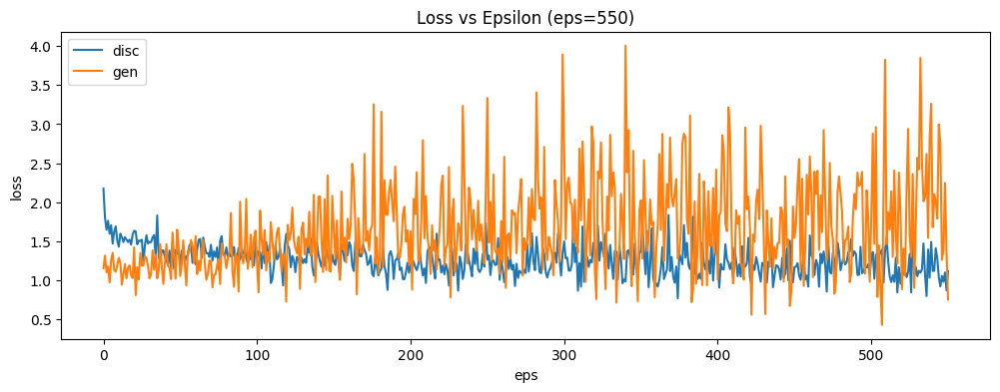

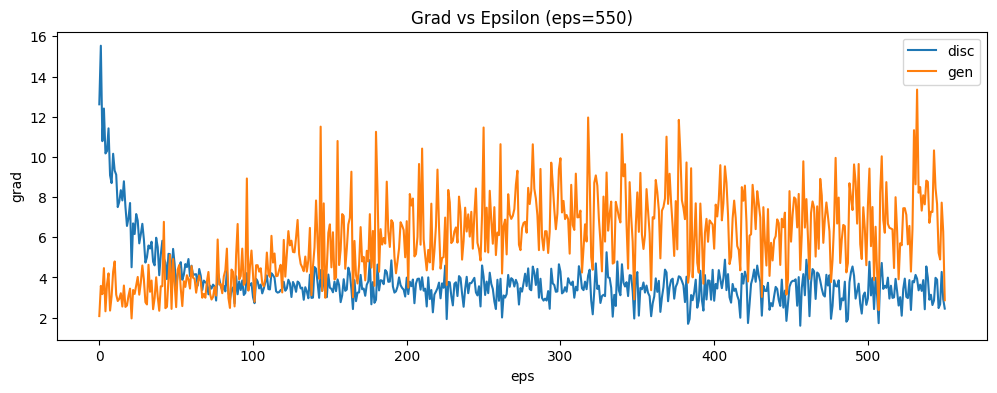

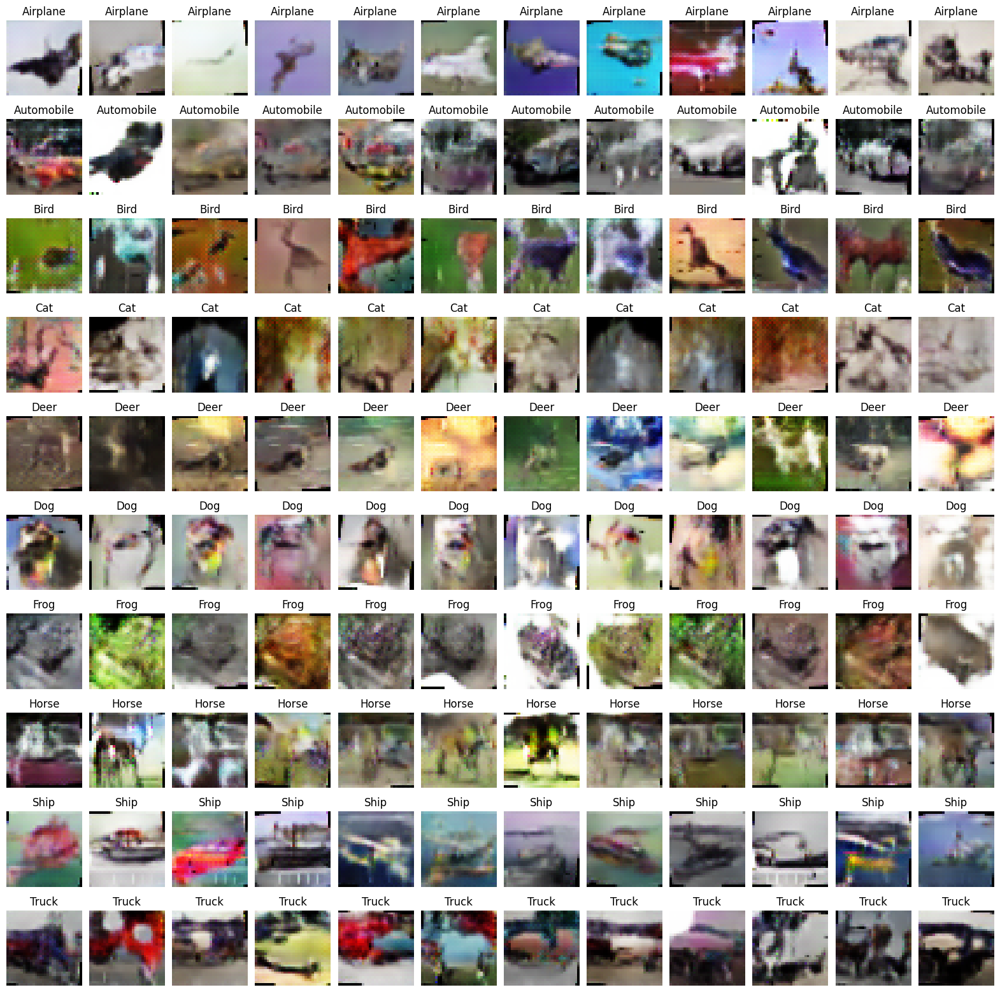

Epoch [552/1001] Loss D: 1.29412, Loss G: 1.17861
Epoch [553/1001] Loss D: 1.23049, Loss G: 2.40848
Epoch [554/1001] Loss D: 1.14163, Loss G: 2.47903
Epoch [555/1001] Loss D: 1.37750, Loss G: 3.23108
Epoch [556/1001] Loss D: 1.06206, Loss G: 1.71792
Epoch [557/1001] Loss D: 1.16764, Loss G: 1.24832
Epoch [558/1001] Loss D: 1.78088, Loss G: 1.69318
Epoch [559/1001] Loss D: 1.24918, Loss G: 2.47535
Epoch [560/1001] Loss D: 1.64777, Loss G: 2.30830
Epoch [561/1001] Loss D: 1.09295, Loss G: 1.98606
Epoch [562/1001] Loss D: 1.37373, Loss G: 1.76442
Epoch [563/1001] Loss D: 1.22138, Loss G: 3.23535
Epoch [564/1001] Loss D: 1.21403, Loss G: 2.51554
Epoch [565/1001] Loss D: 0.98559, Loss G: 2.51819
Epoch [566/1001] Loss D: 0.99777, Loss G: 0.45372
Epoch [567/1001] Loss D: 1.42719, Loss G: 1.76789
Epoch [568/1001] Loss D: 1.18004, Loss G: 1.38017
Epoch [569/1001] Loss D: 0.81607, Loss G: 2.23013
Epoch [570/1001] Loss D: 1.13210, Loss G: 1.47383
Epoch [571/1001] Loss D: 0.91079, Loss G: 1.19740


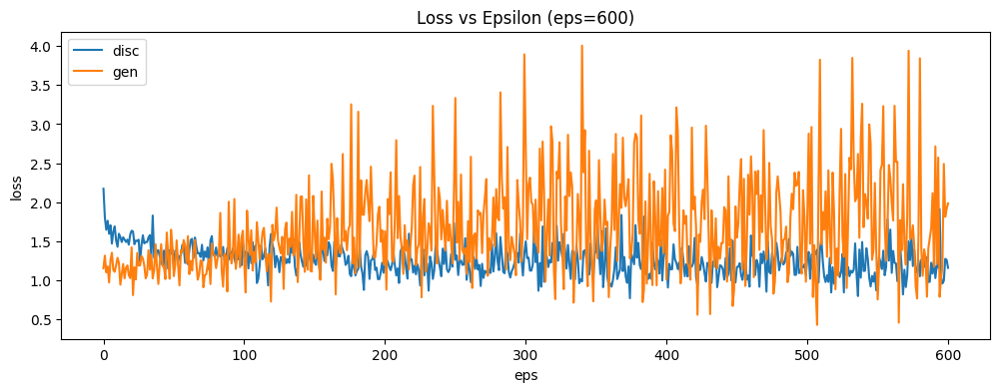

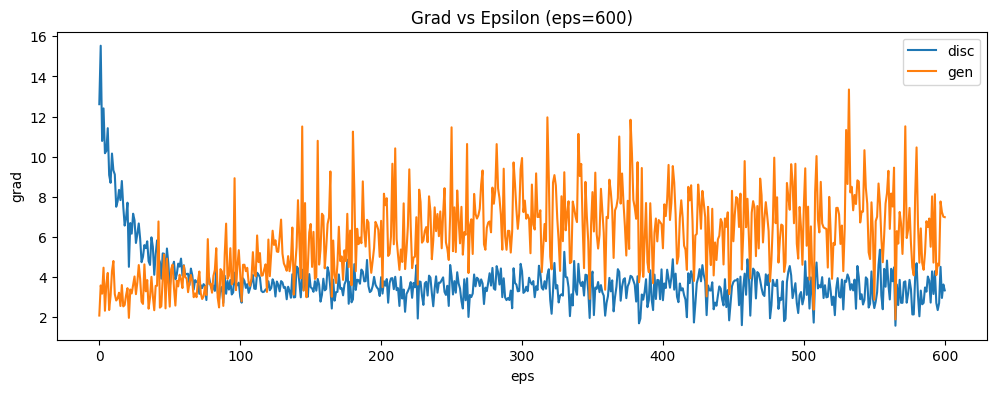

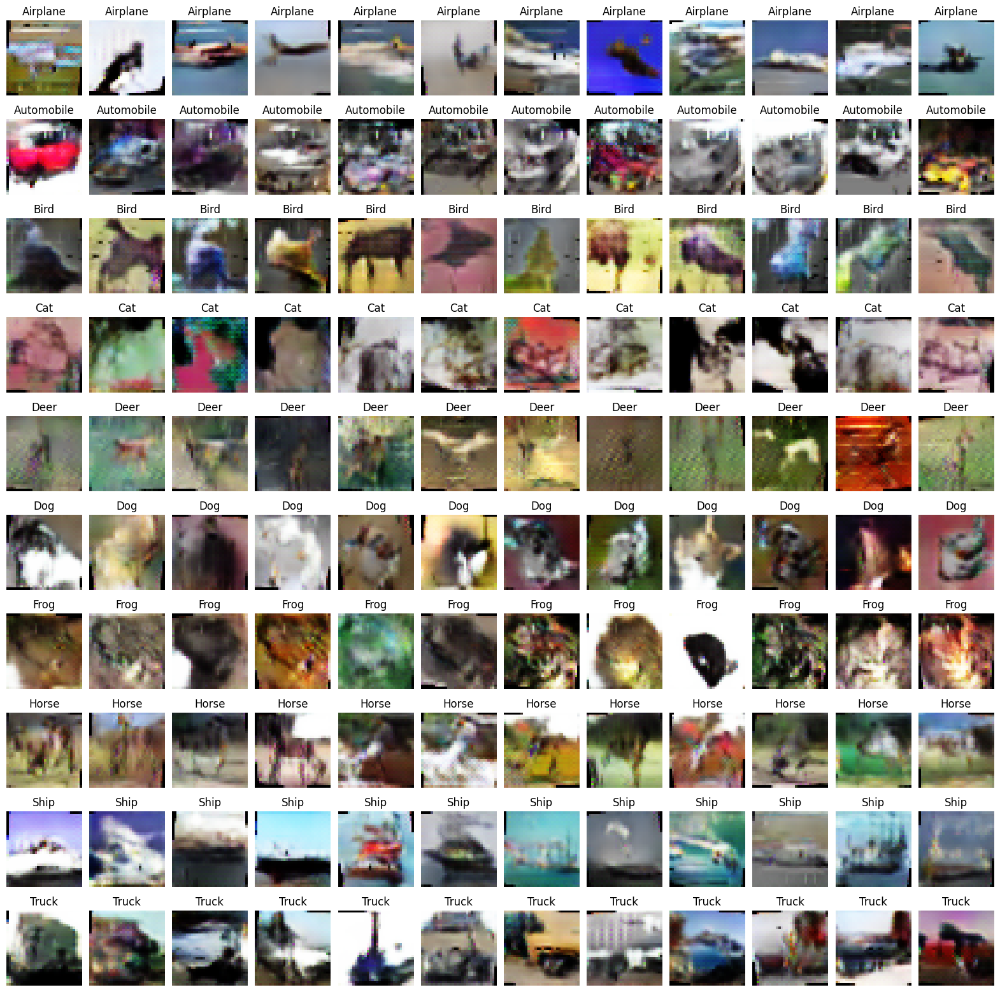

Epoch [602/1001] Loss D: 1.23136, Loss G: 2.27722
Epoch [603/1001] Loss D: 1.34604, Loss G: 1.29967
Epoch [604/1001] Loss D: 0.99727, Loss G: 1.50428
Epoch [605/1001] Loss D: 1.32731, Loss G: 1.75535
Epoch [606/1001] Loss D: 1.26199, Loss G: 2.06288
Epoch [607/1001] Loss D: 1.07258, Loss G: 3.44003
Epoch [608/1001] Loss D: 1.00440, Loss G: 1.57791
Epoch [609/1001] Loss D: 1.46058, Loss G: 2.25914
Epoch [610/1001] Loss D: 1.16903, Loss G: 2.53608
Epoch [611/1001] Loss D: 1.13519, Loss G: 2.98998
Epoch [612/1001] Loss D: 1.25054, Loss G: 0.78949
Epoch [613/1001] Loss D: 1.03922, Loss G: 2.15557
Epoch [614/1001] Loss D: 0.96963, Loss G: 1.68970
Epoch [615/1001] Loss D: 0.96783, Loss G: 2.19761
Epoch [616/1001] Loss D: 1.39437, Loss G: 1.63341
Epoch [617/1001] Loss D: 1.73678, Loss G: 1.07980
Epoch [618/1001] Loss D: 1.16418, Loss G: 1.95007
Epoch [619/1001] Loss D: 1.30410, Loss G: 2.35164
Epoch [620/1001] Loss D: 1.16017, Loss G: 1.44433
Epoch [621/1001] Loss D: 1.53515, Loss G: 2.94085


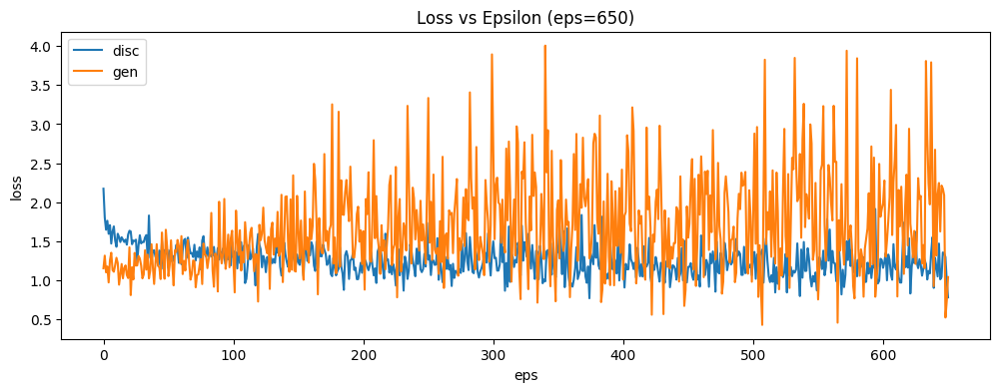

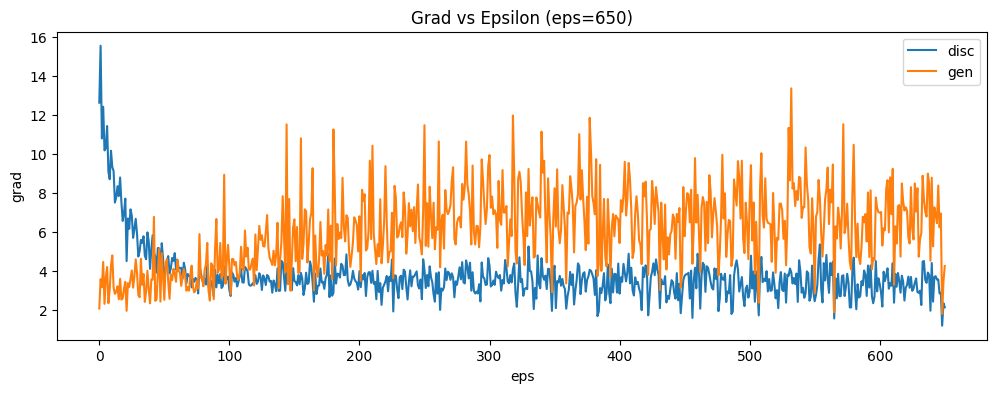

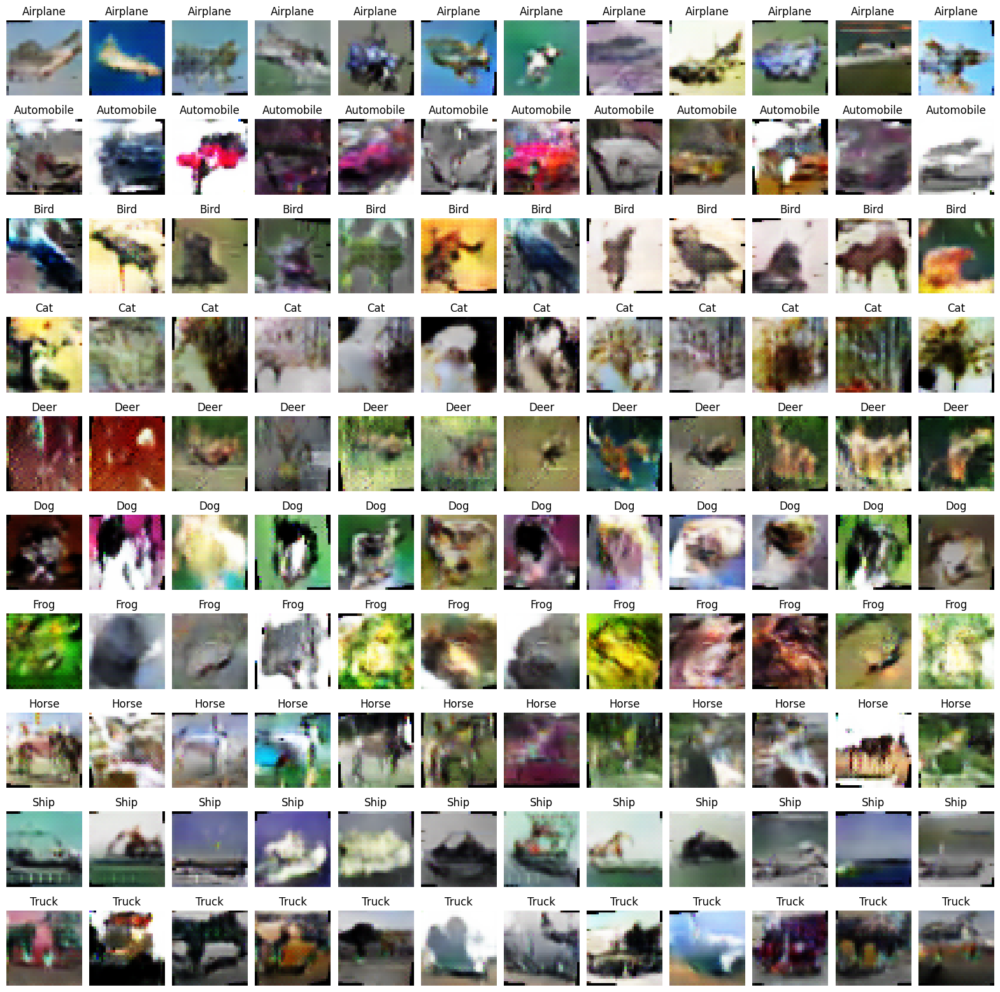

Epoch [652/1001] Loss D: 1.00310, Loss G: 1.57449
Epoch [653/1001] Loss D: 1.19341, Loss G: 1.62184
Epoch [654/1001] Loss D: 1.00564, Loss G: 2.07994
Epoch [655/1001] Loss D: 0.87381, Loss G: 2.25445
Epoch [656/1001] Loss D: 1.42771, Loss G: 1.39144
Epoch [657/1001] Loss D: 0.96762, Loss G: 2.49754
Epoch [658/1001] Loss D: 1.33884, Loss G: 2.42018
Epoch [659/1001] Loss D: 1.25271, Loss G: 2.55398
Epoch [660/1001] Loss D: 1.23797, Loss G: 2.18314
Epoch [661/1001] Loss D: 0.86234, Loss G: 2.18352
Epoch [662/1001] Loss D: 0.97071, Loss G: 1.57881
Epoch [663/1001] Loss D: 0.97523, Loss G: 1.74745
Epoch [664/1001] Loss D: 1.17443, Loss G: 0.94470
Epoch [665/1001] Loss D: 1.23860, Loss G: 1.26620
Epoch [666/1001] Loss D: 0.96536, Loss G: 2.16505
Epoch [667/1001] Loss D: 1.01397, Loss G: 2.60068
Epoch [668/1001] Loss D: 1.27409, Loss G: 1.97603
Epoch [669/1001] Loss D: 1.38079, Loss G: 2.55160
Epoch [670/1001] Loss D: 1.19628, Loss G: 1.41203
Epoch [671/1001] Loss D: 1.32132, Loss G: 1.03704


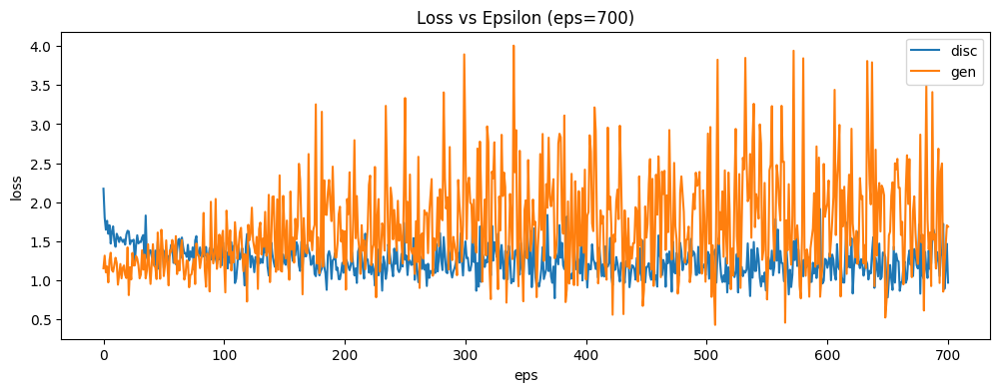

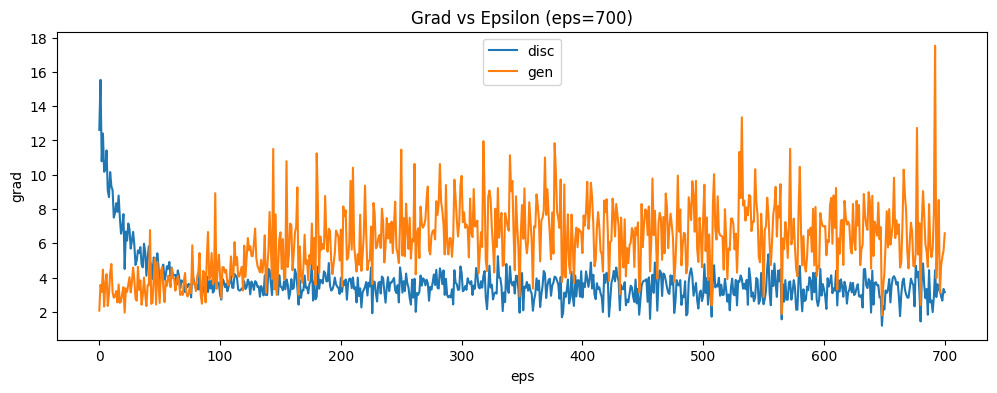

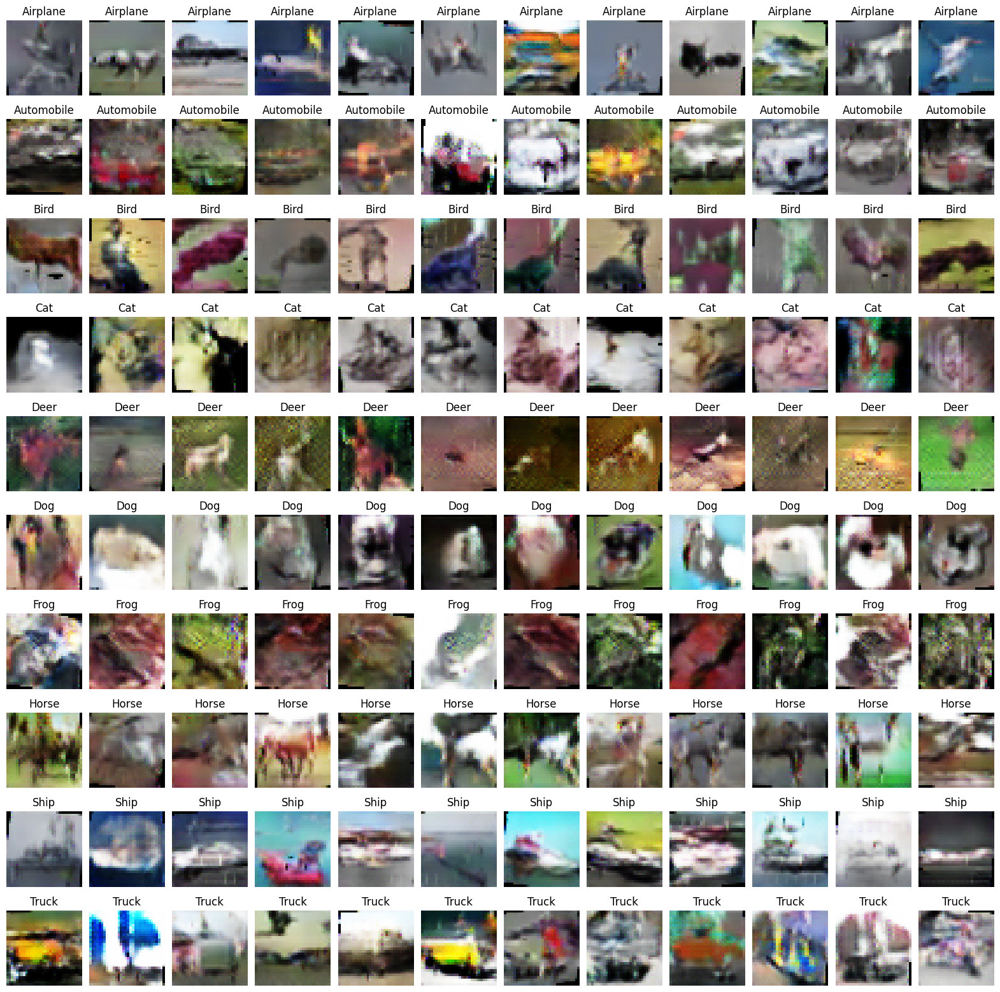

Epoch [702/1001] Loss D: 1.32161, Loss G: 2.05626
Epoch [703/1001] Loss D: 1.31595, Loss G: 2.32739
Epoch [704/1001] Loss D: 1.02898, Loss G: 1.40605
Epoch [705/1001] Loss D: 1.41736, Loss G: 1.10182
Epoch [706/1001] Loss D: 1.06508, Loss G: 1.60016
Epoch [707/1001] Loss D: 1.19519, Loss G: 2.93325
Epoch [708/1001] Loss D: 1.09539, Loss G: 0.72468
Epoch [709/1001] Loss D: 1.20348, Loss G: 2.74359
Epoch [710/1001] Loss D: 1.32536, Loss G: 2.44203
Epoch [711/1001] Loss D: 1.22145, Loss G: 1.33054
Epoch [712/1001] Loss D: 1.19323, Loss G: 3.52920
Epoch [713/1001] Loss D: 0.88474, Loss G: 0.69555
Epoch [714/1001] Loss D: 1.14117, Loss G: 2.10959
Epoch [715/1001] Loss D: 1.11240, Loss G: 2.28839
Epoch [716/1001] Loss D: 1.29744, Loss G: 1.35743
Epoch [717/1001] Loss D: 1.05589, Loss G: 1.93314
Epoch [718/1001] Loss D: 1.23429, Loss G: 0.98358
Epoch [719/1001] Loss D: 1.15789, Loss G: 0.78836
Epoch [720/1001] Loss D: 0.95086, Loss G: 1.32177
Epoch [721/1001] Loss D: 1.86980, Loss G: 1.21210


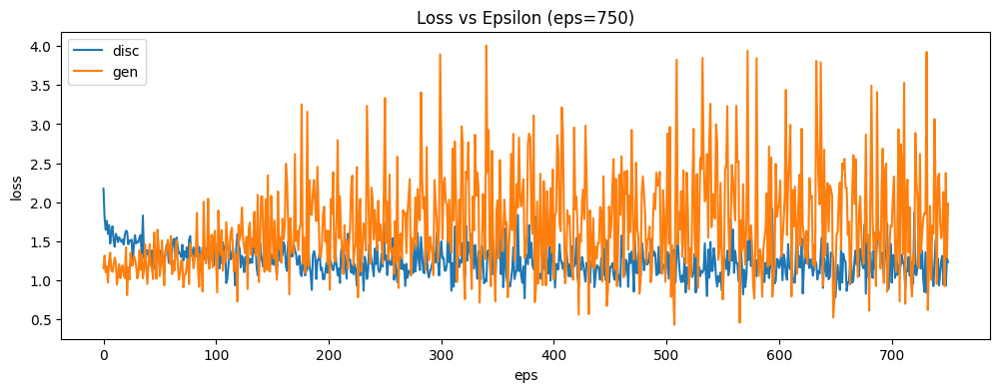

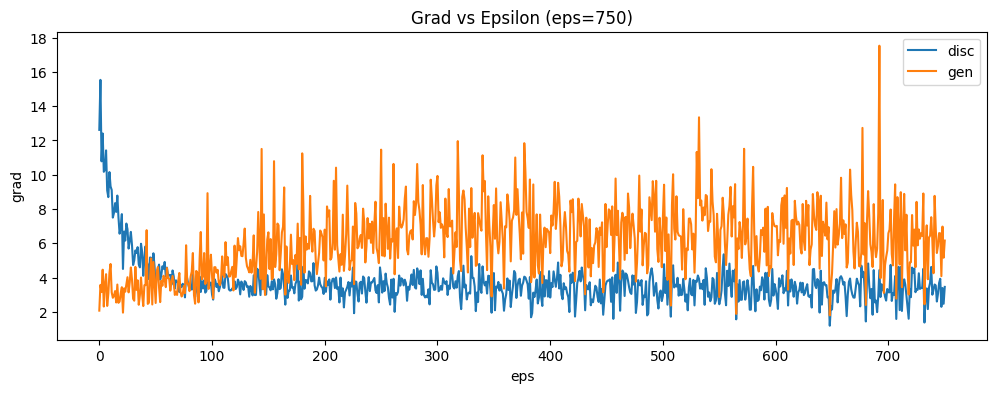

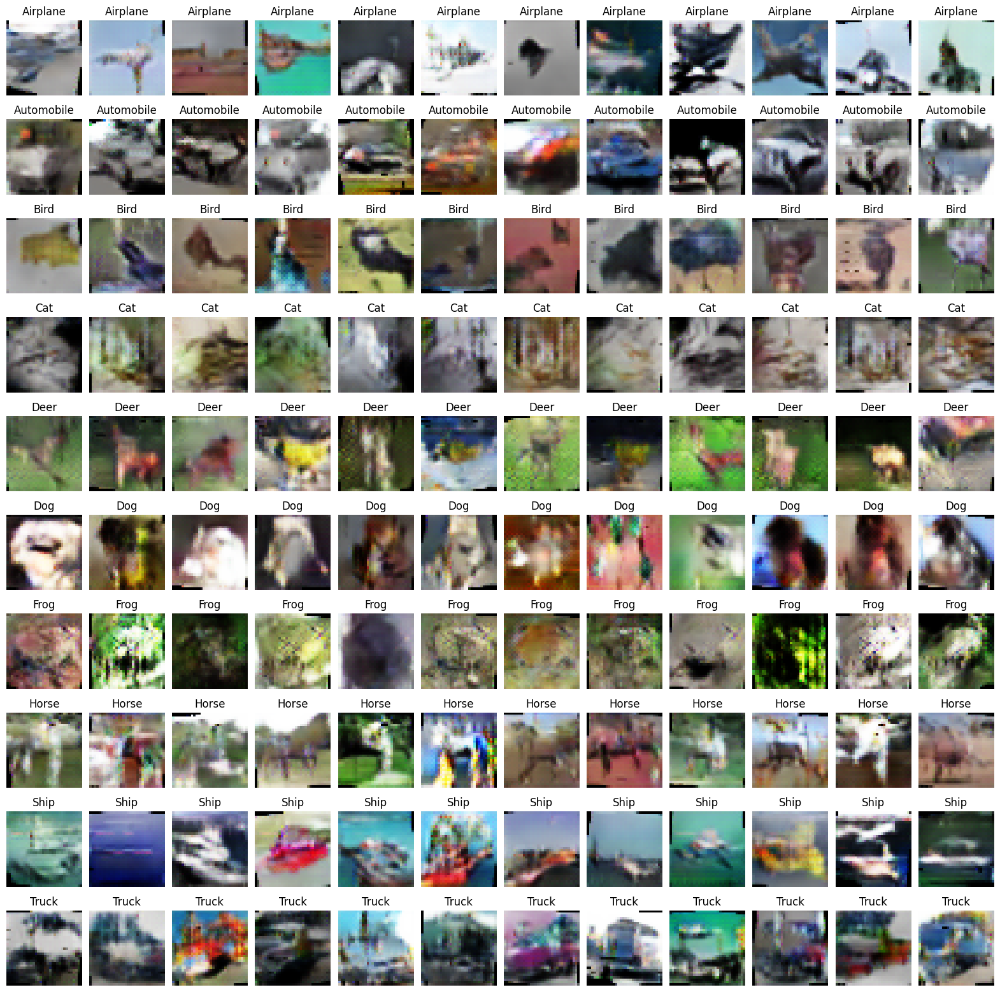

Epoch [752/1001] Loss D: 1.61357, Loss G: 1.62128
Epoch [753/1001] Loss D: 0.91979, Loss G: 1.38380
Epoch [754/1001] Loss D: 1.08365, Loss G: 1.53259
Epoch [755/1001] Loss D: 1.37504, Loss G: 0.76395
Epoch [756/1001] Loss D: 1.13495, Loss G: 2.08587
Epoch [757/1001] Loss D: 1.08206, Loss G: 2.00153
Epoch [758/1001] Loss D: 1.28432, Loss G: 1.26769
Epoch [759/1001] Loss D: 1.02700, Loss G: 2.46122
Epoch [760/1001] Loss D: 1.04861, Loss G: 2.56482
Epoch [761/1001] Loss D: 1.35654, Loss G: 2.02727
Epoch [762/1001] Loss D: 1.10922, Loss G: 2.25646
Epoch [763/1001] Loss D: 1.37415, Loss G: 1.57767
Epoch [764/1001] Loss D: 0.93112, Loss G: 1.28608
Epoch [765/1001] Loss D: 1.28321, Loss G: 1.71389
Epoch [766/1001] Loss D: 0.95836, Loss G: 2.34647
Epoch [767/1001] Loss D: 1.41419, Loss G: 1.76296
Epoch [768/1001] Loss D: 0.81019, Loss G: 2.20274
Epoch [769/1001] Loss D: 1.10044, Loss G: 1.40732
Epoch [770/1001] Loss D: 1.33531, Loss G: 2.71360
Epoch [771/1001] Loss D: 1.32967, Loss G: 2.41178


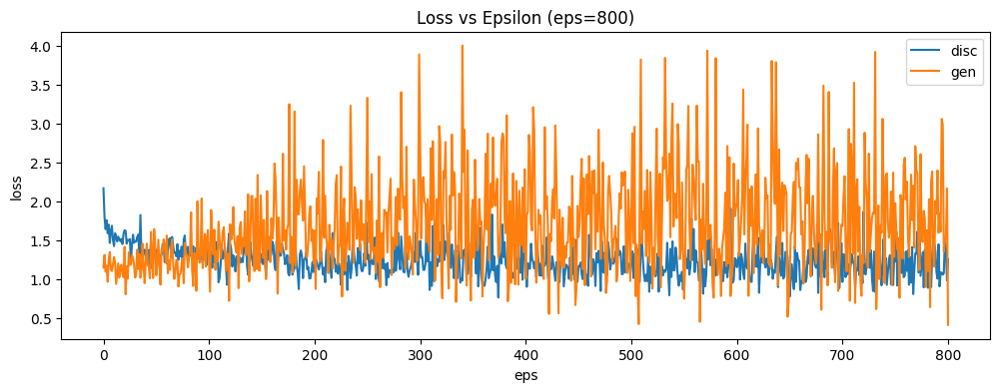

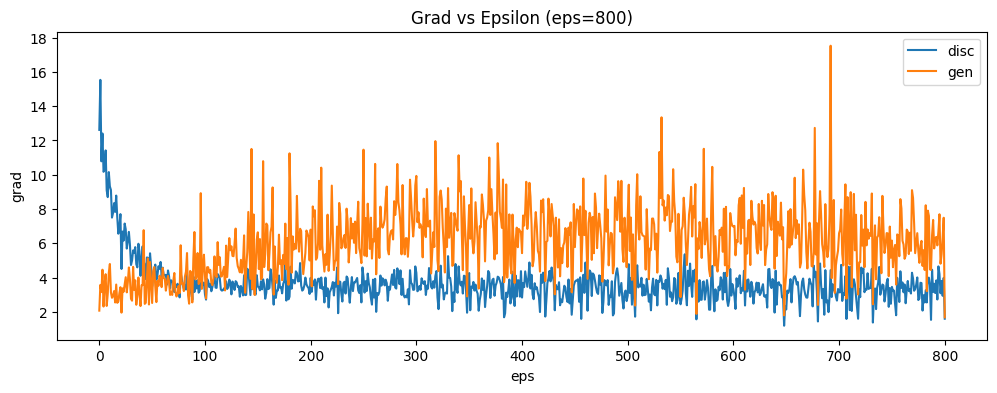

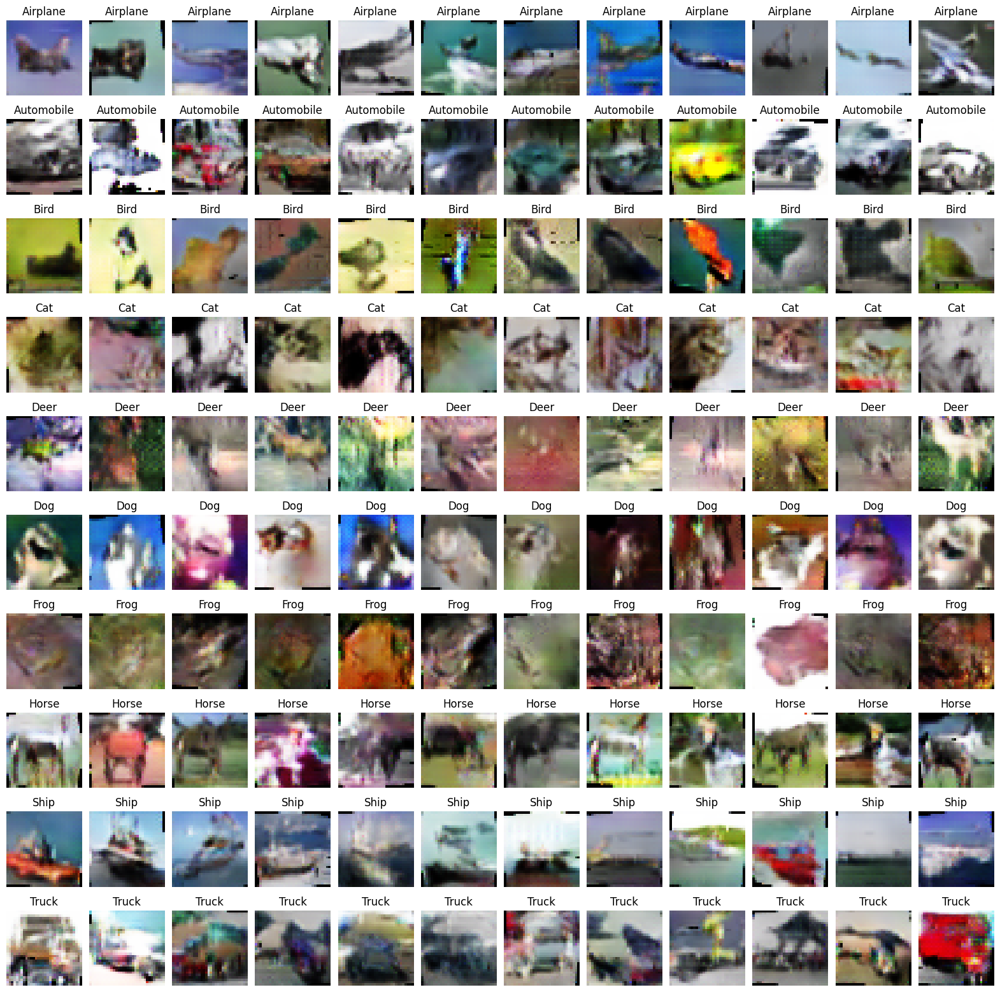

Epoch [802/1001] Loss D: 1.50500, Loss G: 1.20402
Epoch [803/1001] Loss D: 1.16670, Loss G: 2.22939
Epoch [804/1001] Loss D: 0.94170, Loss G: 1.32884
Epoch [805/1001] Loss D: 1.43088, Loss G: 2.35157
Epoch [806/1001] Loss D: 1.22850, Loss G: 1.74445
Epoch [807/1001] Loss D: 1.10847, Loss G: 2.75140
Epoch [808/1001] Loss D: 0.88693, Loss G: 1.94982
Epoch [809/1001] Loss D: 1.39531, Loss G: 2.38331
Epoch [810/1001] Loss D: 1.16559, Loss G: 1.67547
Epoch [811/1001] Loss D: 1.29919, Loss G: 1.53064
Epoch [812/1001] Loss D: 1.39405, Loss G: 1.12158
Epoch [813/1001] Loss D: 1.20241, Loss G: 2.10739
Epoch [814/1001] Loss D: 1.37911, Loss G: 2.01470
Epoch [815/1001] Loss D: 1.19563, Loss G: 1.35312
Epoch [816/1001] Loss D: 1.05543, Loss G: 1.07729
Epoch [817/1001] Loss D: 1.73012, Loss G: 2.14229
Epoch [818/1001] Loss D: 1.44444, Loss G: 1.21741
Epoch [819/1001] Loss D: 1.65593, Loss G: 0.94467
Epoch [820/1001] Loss D: 1.35591, Loss G: 2.04611
Epoch [821/1001] Loss D: 1.30463, Loss G: 1.99596


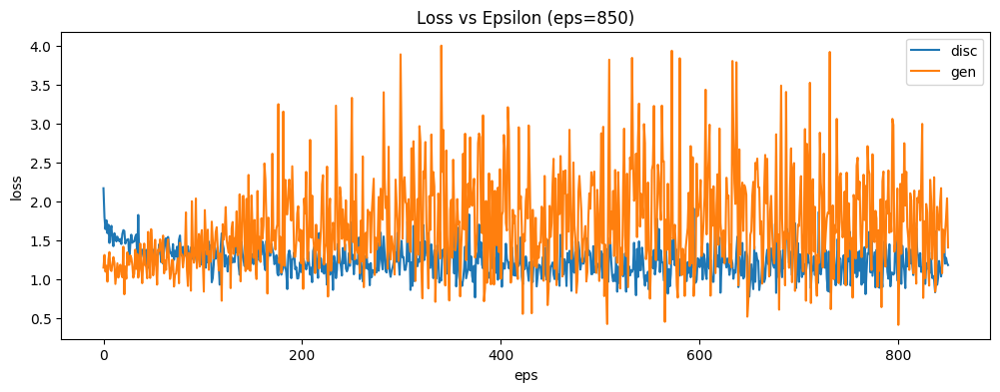

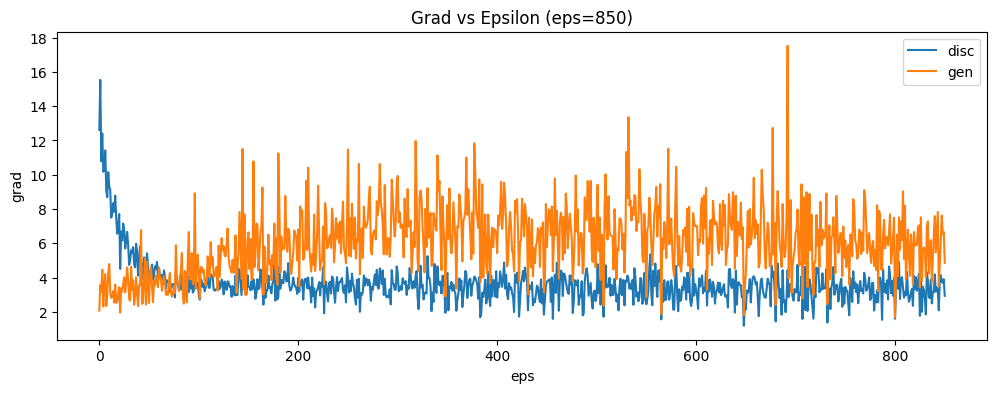

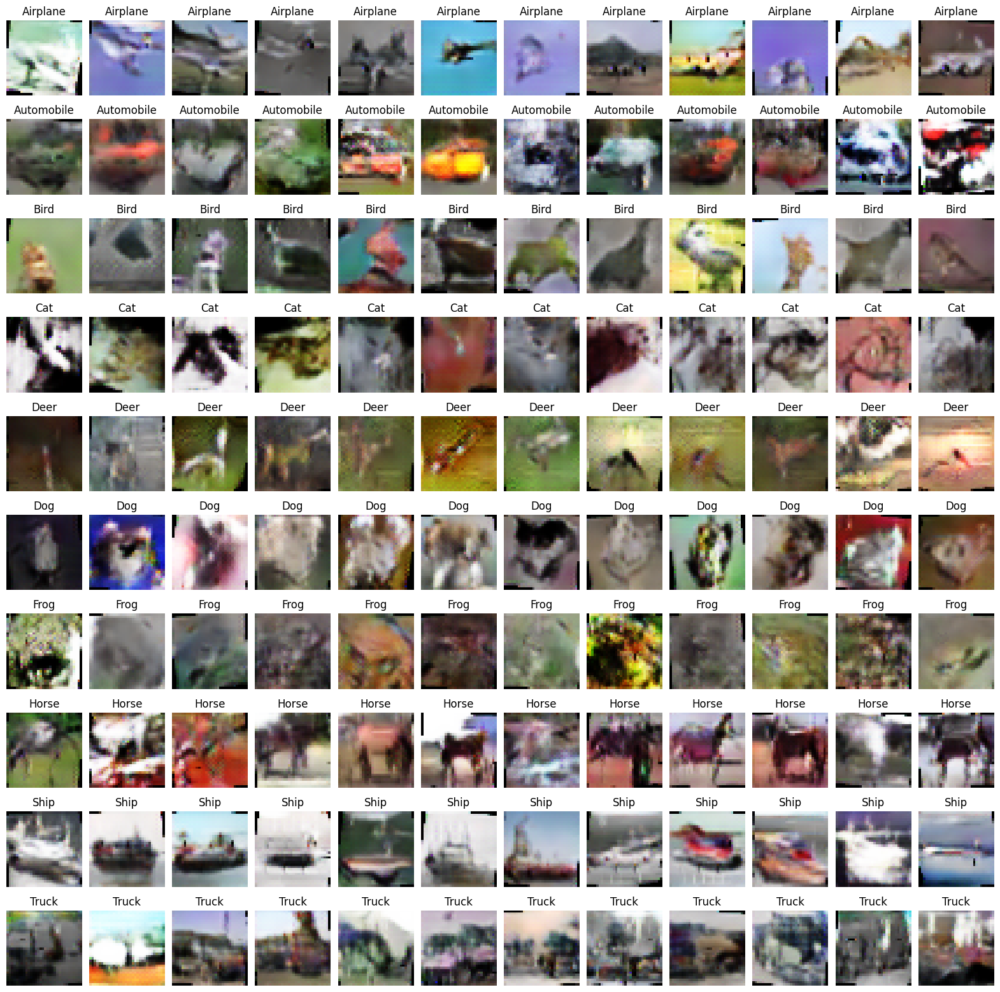

Epoch [852/1001] Loss D: 1.35150, Loss G: 1.29796
Epoch [853/1001] Loss D: 0.98873, Loss G: 1.83013
Epoch [854/1001] Loss D: 1.41426, Loss G: 2.22388
Epoch [855/1001] Loss D: 1.61255, Loss G: 2.17837
Epoch [856/1001] Loss D: 1.42743, Loss G: 1.58127
Epoch [857/1001] Loss D: 1.01345, Loss G: 1.64123
Epoch [858/1001] Loss D: 1.59106, Loss G: 1.60964
Epoch [859/1001] Loss D: 1.46487, Loss G: 2.66184
Epoch [860/1001] Loss D: 1.52866, Loss G: 1.01261
Epoch [861/1001] Loss D: 1.45614, Loss G: 1.55421
Epoch [862/1001] Loss D: 1.16632, Loss G: 2.75756
Epoch [863/1001] Loss D: 1.14316, Loss G: 1.58903
Epoch [864/1001] Loss D: 1.18737, Loss G: 0.67753
Epoch [865/1001] Loss D: 1.41729, Loss G: 1.70419
Epoch [866/1001] Loss D: 1.23591, Loss G: 2.41433
Epoch [867/1001] Loss D: 1.08798, Loss G: 0.95850
Epoch [868/1001] Loss D: 1.29413, Loss G: 1.91019
Epoch [869/1001] Loss D: 0.98066, Loss G: 1.27876
Epoch [870/1001] Loss D: 1.43184, Loss G: 1.67482
Epoch [871/1001] Loss D: 1.17281, Loss G: 2.13191


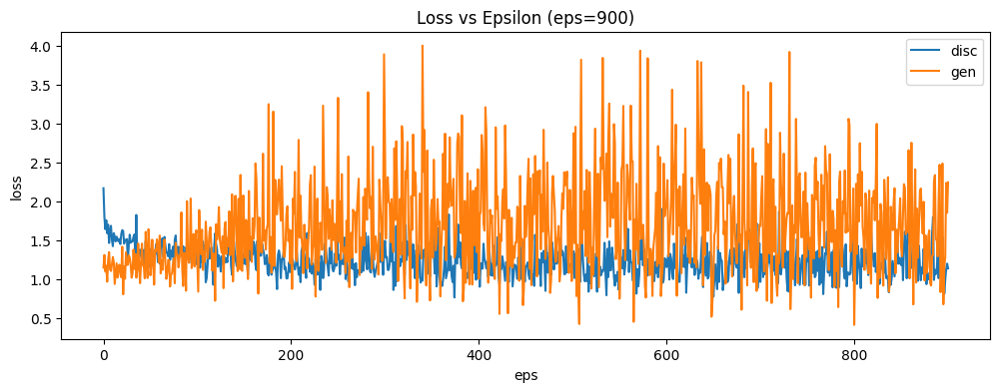

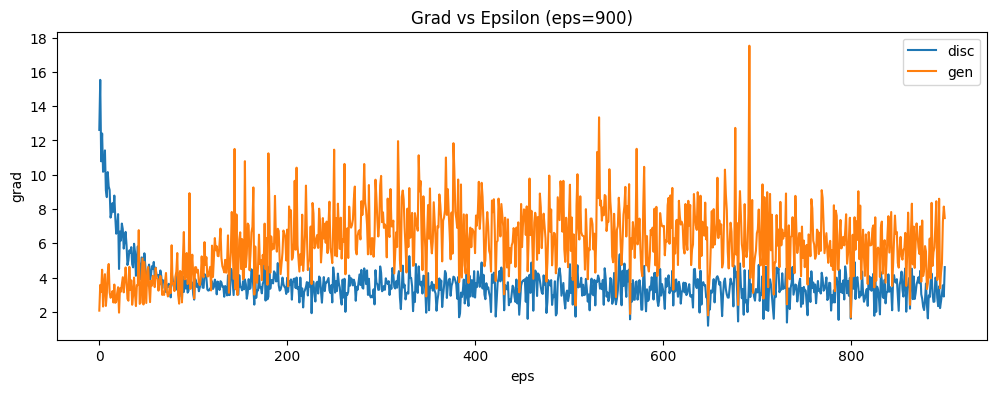

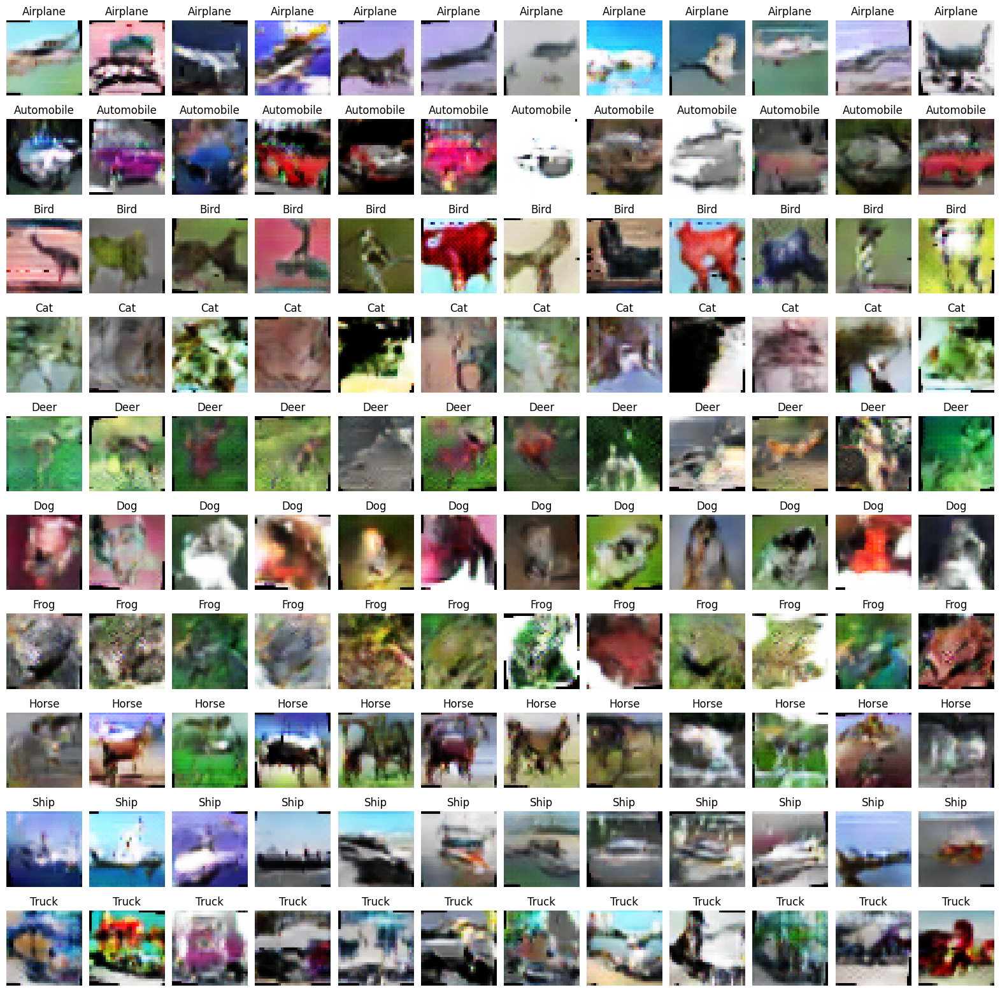

Epoch [902/1001] Loss D: 1.67311, Loss G: 1.12471
Epoch [903/1001] Loss D: 1.10866, Loss G: 0.82907
Epoch [904/1001] Loss D: 1.37014, Loss G: 0.85016
Epoch [905/1001] Loss D: 1.04704, Loss G: 2.27259
Epoch [906/1001] Loss D: 1.19932, Loss G: 1.39095
Epoch [907/1001] Loss D: 1.26241, Loss G: 1.98266
Epoch [908/1001] Loss D: 0.98690, Loss G: 1.93585
Epoch [909/1001] Loss D: 1.13580, Loss G: 2.17631
Epoch [910/1001] Loss D: 1.08308, Loss G: 2.40102
Epoch [911/1001] Loss D: 1.28481, Loss G: 2.64146
Epoch [912/1001] Loss D: 1.44491, Loss G: 2.49491
Epoch [913/1001] Loss D: 1.24686, Loss G: 1.44645
Epoch [914/1001] Loss D: 1.03054, Loss G: 2.24245
Epoch [915/1001] Loss D: 1.02447, Loss G: 1.63128
Epoch [916/1001] Loss D: 1.49427, Loss G: 2.77403
Epoch [917/1001] Loss D: 1.00093, Loss G: 2.29477
Epoch [918/1001] Loss D: 1.34851, Loss G: 1.06212
Epoch [919/1001] Loss D: 1.26600, Loss G: 1.80452
Epoch [920/1001] Loss D: 1.53259, Loss G: 0.90688
Epoch [921/1001] Loss D: 1.12989, Loss G: 1.19132


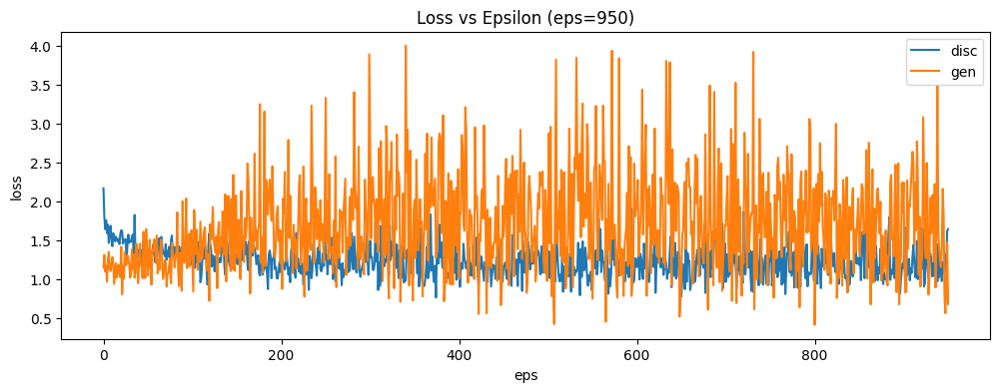

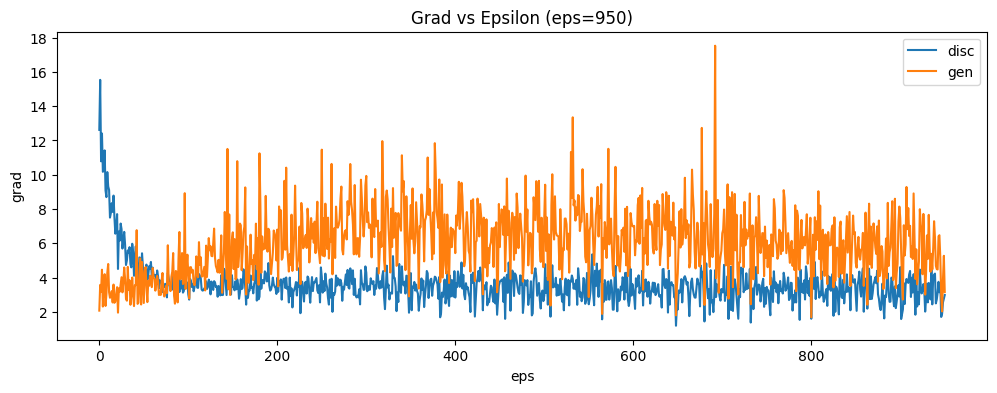

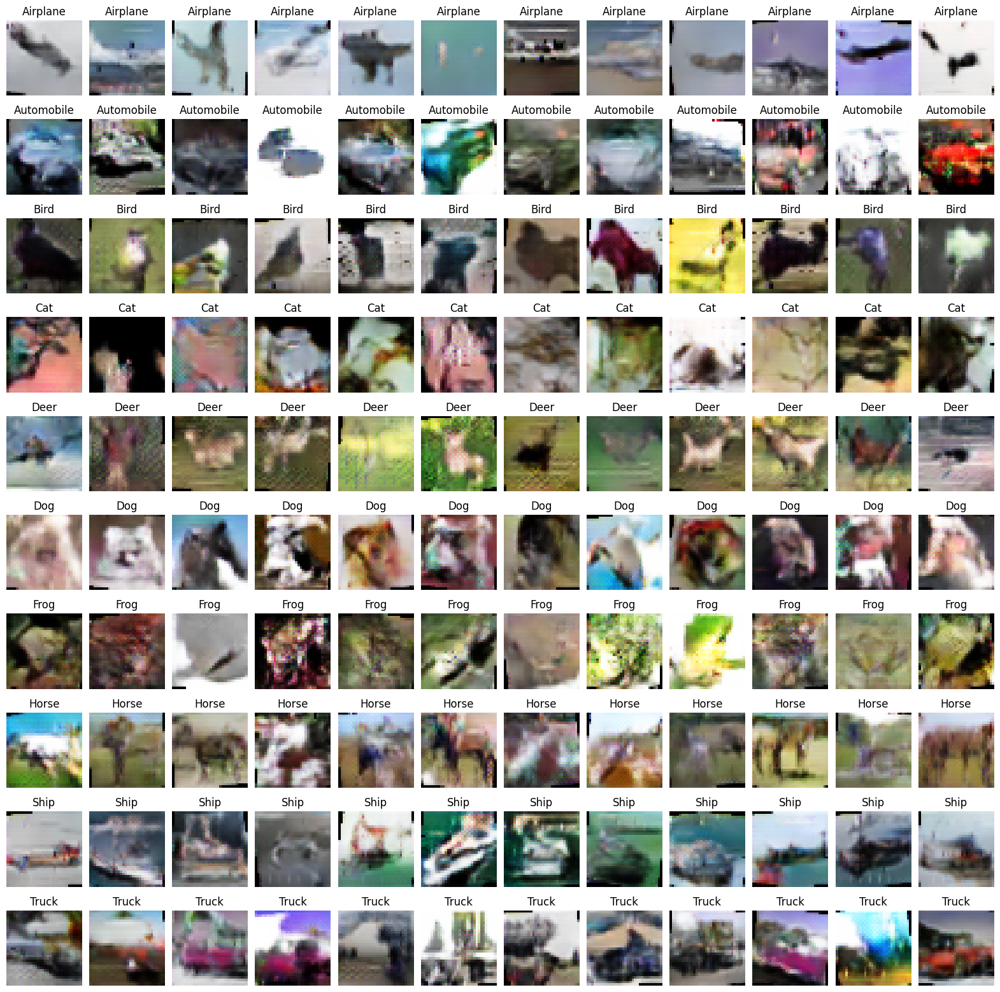

Epoch [952/1001] Loss D: 0.95862, Loss G: 1.29864
Epoch [953/1001] Loss D: 1.45699, Loss G: 1.99935
Epoch [954/1001] Loss D: 1.25420, Loss G: 1.73807
Epoch [955/1001] Loss D: 1.05133, Loss G: 1.79707
Epoch [956/1001] Loss D: 0.88467, Loss G: 1.01671
Epoch [957/1001] Loss D: 1.25911, Loss G: 1.53709
Epoch [958/1001] Loss D: 1.28229, Loss G: 1.73552
Epoch [959/1001] Loss D: 1.05431, Loss G: 1.07305
Epoch [960/1001] Loss D: 1.36213, Loss G: 1.26579
Epoch [961/1001] Loss D: 1.26337, Loss G: 0.66303
Epoch [962/1001] Loss D: 1.30738, Loss G: 1.43387
Epoch [963/1001] Loss D: 1.25003, Loss G: 3.33274
Epoch [964/1001] Loss D: 1.07783, Loss G: 2.06439
Epoch [965/1001] Loss D: 1.25546, Loss G: 3.84826
Epoch [966/1001] Loss D: 1.56438, Loss G: 1.74715
Epoch [967/1001] Loss D: 1.27101, Loss G: 0.81482
Epoch [968/1001] Loss D: 1.08555, Loss G: 0.59296
Epoch [969/1001] Loss D: 1.17900, Loss G: 2.26879
Epoch [970/1001] Loss D: 1.44240, Loss G: 1.01668
Epoch [971/1001] Loss D: 1.18344, Loss G: 1.42966


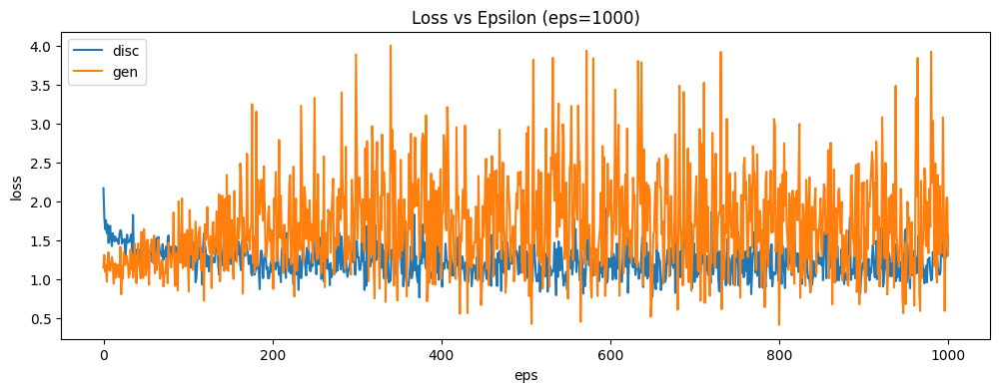

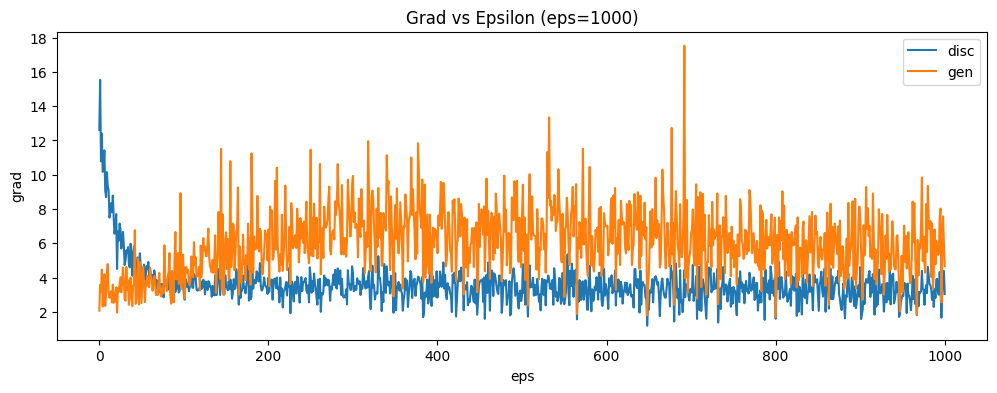

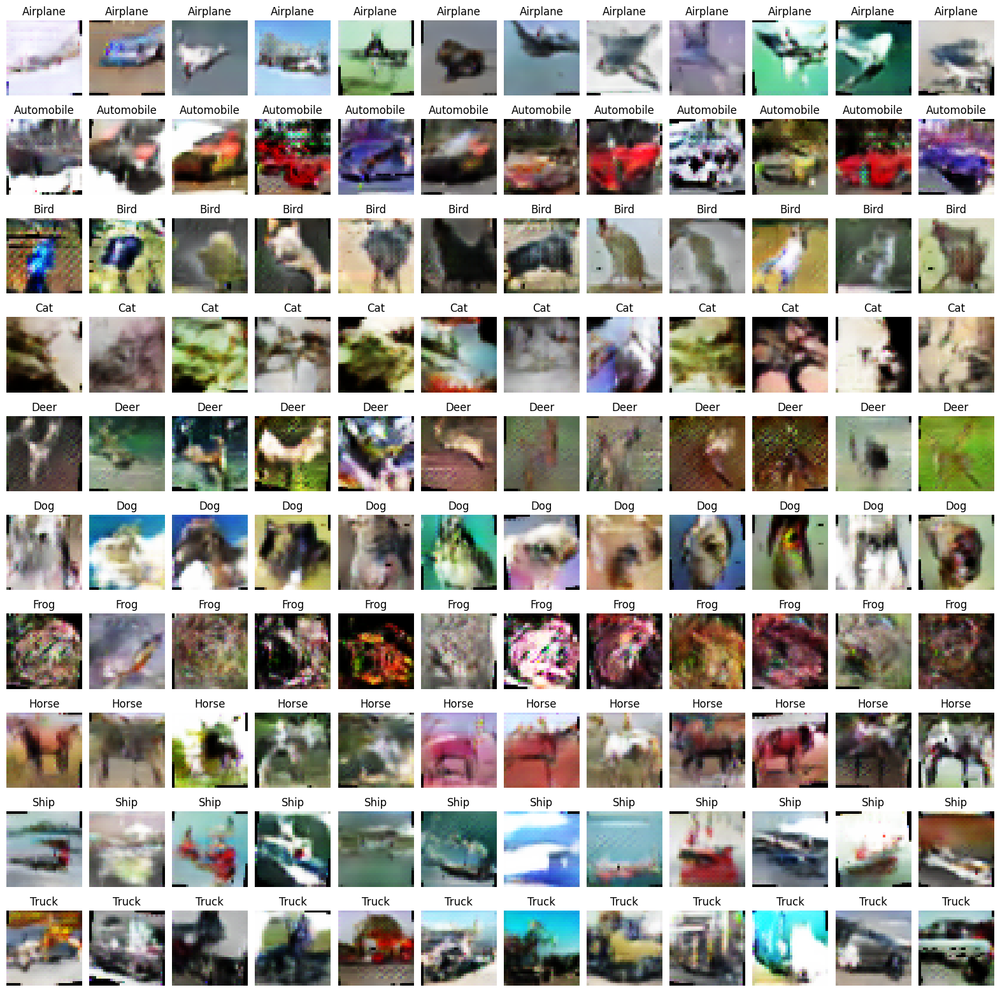

In [8]:
# training
loss_disc_arr = []
loss_gen_arr = []
grad_disc_arr = []
grad_gen_arr = []
for i in range(epochs):

    generator.train()
    discriminator.train()
    
    for batch_idx, (real_images, real_labels) in enumerate(train_dataloader):
        batch_size = real_images.size(0)

        REAL = torch.ones(batch_size, 1, requires_grad=False, device=device)
        FAKE = torch.zeros(batch_size, 1, requires_grad=False, device=device)

        real_images = real_images.to(device)
        real_labels = real_labels.to(device)

        # train discriminator
        discriminator.zero_grad()

        # Loss for real images
        real_labels_pred, real_validity_pred = discriminator(real_images)
        validity_loss_real = adversarial_loss(real_validity_pred, REAL)
        class_loss_real = auxiliary_loss(real_labels_pred, real_labels)

        # Generate fake images and labels
        noise = torch.normal(0, 1, (batch_size, z_dim)).to(device)
        fake_labels = torch.randint(0, class_dim, (batch_size,)).to(device)
        fake_images = generator(fake_labels, noise)

        # Loss for fake images
        fake_labels_pred, fake_validity_pred = discriminator(fake_images.detach())
        validity_loss_fake = adversarial_loss(fake_validity_pred, FAKE)
        class_loss_fake = auxiliary_loss(fake_labels_pred, fake_labels)

        # Total discriminator loss
        loss_disc = (validity_loss_real + validity_loss_fake) * 0.5 + (class_loss_real + class_loss_fake) * 0.5
        loss_disc.backward()
        opt_disc.step()

        # train generator
        generator.zero_grad()

        # All fake images are treated as real
        labels_pred, validity_pred = discriminator(fake_images)
        loss_gen = adversarial_loss(validity_pred, REAL) + auxiliary_loss(labels_pred, fake_labels)
        loss_gen.backward()
        opt_gen.step()

    print(f"Epoch [{i+1}/{epochs}] Loss D: {loss_disc:.5f}, Loss G: {loss_gen:.5f}")
    loss_disc_arr.append(loss_disc.detach().cpu().numpy().item())
    loss_gen_arr.append(loss_gen.detach().cpu().numpy().item())
    # only the grad of the last layer
    grad_disc_arr.append(discriminator.net[-1].weight.grad.norm().item())
    grad_gen_arr.append(generator.net[-2].weight.grad.norm().item())

    # Save Model
    if i % 50 == 0 and i != 0:
        print("Saving ...")
        torch.save(generator.state_dict(), 'generator_AC_'+str(i)+'.pth')
        torch.save(discriminator.state_dict(), 'discriminator_AC_'+str(i)+'.pth')
        
        # testing
        generator_test = Generator(z_dim, class_dim).to(device)
        generator_test.load_state_dict(torch.load("generator_AC_"+str(i)+".pth"))
        generator_test.eval()

        noise = torch.normal(0, 1, (class_dim*12, z_dim)).to(device)
        labels = torch.Tensor(np.repeat(np.arange(0, class_dim), 12)).long().to(device)
        images = generator_test(labels, noise)
        images = images.permute(0, 2, 3, 1)
        images = (images + 1.0) / 2.0

        plot_losses(loss_disc_arr, loss_gen_arr, i)
        plot_grads(grad_disc_arr, grad_gen_arr, i)

        i = 0
        plt.figure(figsize=(20, 20))
        for image in images:
            plt.subplot(class_dim,12,i+1);plt.imshow(image.detach().cpu().numpy());plt.axis("off");
            plt.title("{}".format(labels_txt[int(np.floor(i/12))]))
            i = i + 1
        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        # plt.tight_layout()
        plt.show()